In [98]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
plt.style.use('seaborn-dark')
from astropy.coordinates import SkyCoord
import astropy.units as u
from astropy.table import Table
from marvin import config
from marvin.utils.general import downloadList
import seaborn as sns
from marvin import config
from marvin.utils.general import downloadList
from astropy.cosmology import FlatLambdaCDM
from marvin.tools.maps import Maps
from marvin.tools.image import Image
import matplotlib.image as mpimg
from matplotlib import colors
from astropy.io import fits

In [2]:
pd.set_option('display.max_rows', 300)

In [3]:
# Read in LG12 and BBRD data
lg12 = pd.read_table('/Users/mmckay/Desktop/research/FMR_MZR/lg12_sf_reduced.txt', sep=',')
bbrd = pd.read_table('/Users/mmckay/Desktop/research/FMR_MZR/bbrd_sf_reduced.txt', sep=',')

#remove unnamed row - should fix in other code later
bbrd.drop(labels='Unnamed: 0', axis=1)
lg12.drop(labels='Unnamed: 0', axis=1)

,RASDSSinfo,DecSDSSinfo,zSDSSinfo,HalphaSDSSline [1e-17*erg/cm^2/s],OIII5007SDSSline [1e-17*erg/cm^2/s],OIII4959SDSSline [1e-17*erg/cm^2/s],HbetaSDSSline [1e-17*erg/cm^2/s],HdeltaSDSSline [1e-17*erg/cm^2/s],N6583SDSS [1e-17*erg/cm^2/s],S6717SDSSline [1e-17*erg/cm^2/s],...,OIII4959_kcorr,SII6716_kcorr,SII6731_kcorr,NII6583_kcorr,OII3726_kcorr,OII3729_kcorr,Log(O/H)+12 [NII/OII],Log(O/H)+12 [R23],NII/Halpha,OIII/Hbeta
0,49.782158,0.955980,0.023883,1979.876343,136.290604,43.805649,499.222168,109.908363,730.411194,313.348633,...,54.680665,367.312341,288.725909,859.711141,481.929647,405.651097,9.201621,8.169748,-0.433330,-0.566637
1,53.565945,1.022538,0.047108,440.533752,26.220901,12.495523,98.726089,19.224865,165.566132,48.832035,...,16.896203,60.617707,44.782449,206.673411,46.869898,57.958877,9.314848,8.156398,-0.425361,-0.579606
2,56.847435,0.875481,0.039371,27.740791,3.541369,14.831802,12.857573,13.841022,36.541206,6.120975,...,12.250842,5.337351,-0.028021,31.750870,39.223225,-42.051019,9.083940,-125.640568,0.119888,-0.557566
3,240.136932,-0.166272,0.024222,47.822651,10.288246,8.221836,10.079779,6.279169,14.591676,13.101618,...,11.589648,16.755816,14.626364,18.780092,28.008610,41.793336,9.052376,-30.221285,-0.515931,0.004542
4,243.154617,0.379970,0.043145,42.521477,17.789553,5.021020,17.109659,16.174383,31.328665,-1.724229,...,4.564743,-1.610448,4.786292,29.209894,72.902028,-47.338337,8.956871,-243.509512,-0.132555,0.018130
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2183,147.935669,12.987133,0.042695,33.835594,4.600773,-3.076625,4.179499,11.449845,9.398143,2.667207,...,-6.231417,4.422749,0.321003,15.788275,16.875693,88.071261,9.107167,2.988875,-0.557159,0.032767
2184,130.088608,11.223271,0.048026,382.816437,101.133041,30.483734,103.422867,24.337727,248.077789,83.234261,...,36.311407,94.350236,80.796823,282.118113,86.372343,105.795342,9.279354,6.020611,-0.188608,-0.011939
2185,139.583115,11.614592,0.039697,180.844528,55.985218,23.214804,43.375359,10.134882,110.445885,58.992489,...,29.977820,70.853351,54.713343,133.279244,89.684123,100.198480,9.176249,-16.740634,-0.214455,0.107592
2186,155.675247,14.746340,0.040708,10.551470,-1.124997,5.136387,9.491117,5.789288,0.485318,3.840349,...,2.705851,2.426121,0.913020,0.302992,1.156232,0.419602,8.864845,8.012878,-1.336536,NaN


In [4]:
# read the DR16 drpall file
drpall = Table.read('/Users/mmckay/Desktop/research/dr16_drpall-v2_4_3.fits')
#drpall.colnames

In [5]:
t=Table()
t['Objra'] = drpall['objra'] 
t['Objdec'] = drpall['objdec']
t['mangaid'] = drpall['mangaid']
t['plateifu'] = drpall['plateifu']
t['nsa_z'] = drpall['nsa_z']
#t

In [6]:
dr16 = t.to_pandas()
#dr16

# Input data into Skycoord

In [7]:
# Input DR16 ra and dec into Skycoord
dr16_skycoord = SkyCoord(ra=dr16['Objra'], dec=dr16['Objdec'], frame='icrs', unit=u.deg)

bbrd_skycoord = SkyCoord(ra=bbrd['RASDSSinfo'], dec=bbrd['DecSDSSinfo'], frame='icrs', unit=u.deg)

lg12_skycoord = SkyCoord(ra=lg12['RASDSSinfo'], dec=lg12['DecSDSSinfo'], frame='icrs', unit=u.deg)

In [8]:
# Match the LG12 skycoords with DR16
lg12_dr16_match = lg12_skycoord.match_to_catalog_sky(catalogcoord=dr16_skycoord, nthneighbor=1.)
idx, sep2d, dist3d = lg12_dr16_match
len(idx)

2188

In [9]:
# Convert seperation units from deg to arcsecs
sep = sep2d.to(u.arcsec).value

# Make the pandas dataframe for all match data
lg12_match=pd.DataFrame(columns=['idx', 'sep2d'])
lg12_match['idx'] = idx
lg12_match['sep2d'] = sep2d

# filter the sep2d > 0.1 arcsecs
sep2d_less10 = lg12_match['sep2d'] <= 0.01
lg12_best_match = lg12_match[sep2d_less10]
#lg12_best_match

In [10]:
len(lg12_best_match)

100

In [11]:
# Gather match index
#lg12_best_match_idx = lg12_best_match.index
lg12_best_match_idx = lg12_best_match['idx']
# use the index to dr16
lg12_manga_match = dr16.iloc[lg12_best_match_idx]

In [12]:
#lg12_best_match_idx

In [13]:
#lg12_manga_match

In [14]:
# Format the plateifu and mangaid to str
lg12_plateifu = lg12_manga_match['plateifu']
lg12_mangaid = lg12_manga_match['mangaid']
lg12_plateifu_rn = []
lg12_mangaid_rn = []
for i,j in zip(lg12_plateifu, lg12_mangaid):
    plateifu = str(i)
    mangaid = str(j)
    rn_plateifu = plateifu[2:-1]
    rn_mangaid = mangaid[2:-1]
    lg12_plateifu_rn.append(rn_plateifu)
    lg12_mangaid_rn.append(rn_mangaid)


In [15]:
lg12_manga_match['plateifu'] = lg12_plateifu_rn
lg12_manga_match['mangaid'] = lg12_mangaid_rn

[WARNING]:  (SettingWithCopyWarning)


In [16]:
#lg12_manga_match

In [17]:
# Remove BBRD galaxies from LG12 sample and make a new dataframe
bbrd_platifu = ['10001-3702','8254-1902', '8465-9102', '8595-3703', '8312-12704', '8550-12703']
bbrd_manga_match = lg12_manga_match.loc[lg12_manga_match['plateifu'].isin(bbrd_platifu)]


# Create the final lg12 MaNGA ids
lg12_manga_match_filt = lg12_manga_match.drop(labels=bbrd_manga_match.index)
#lg12_manga_match_filt

In [18]:
bbrd_manga_match

,Objra,Objdec,mangaid,plateifu,nsa_z
1860,247.674430,40.529389,1-135054,8550-12703,0.029812
2472,247.304125,41.150872,1-633990,8312-12704,0.029593
5871,132.912768,57.107424,1-48136,10001-3702,0.025606
10819,198.189163,46.934987,1-284526,8465-9102,0.027681
4357,163.219110,43.428404,1-255878,8254-1902,0.024237
6433,221.437984,51.580820,1-631278,8595-3703,0.029627


In [19]:
#lg12_manga_match_filt

## Working Marvin, Download LG12 Map files:

In [20]:
# Explicit call
#from marvin import config
#from marvin.utils.general import downloadList
#config.setRelease('DR16')
#lg12_manga_list = np.array(lg12_manga_match['plateifu'])
## Make a list of plate-IFUs
#gallist = lg12_manga_list
#
## Download cubes for the objects in your list
#downloadList(gallist, dltype='maps')
#
## Note cant find data plateifu
## 8680-12701
## 9516/12701
## 8803-12701

In [21]:
from marvin import config
from marvin.utils.general import downloadList
config.setRelease('DR16')
# query manga functions
def query_manga_map(plateifu_list, dr):
    config.setRelease(dr)
    downloadList(plateifu_list, dltype='maps') #download maps
    downloadList(plateifu_list, dltype='image')

### Vetting not found data

In [22]:
lg12_plateifu = lg12_manga_match_filt['plateifu']#np.array(lg12_manga_match['plateifu'])
#lg12_plateifu

In [23]:
bad_idx = np.where(lg12_plateifu=='9658-12704')
bad_idx

# Note cant find data plateifu
# 8680-12701
# 9516-12701
# 8803-12701
# 8682-12701
# 9802-12701
# 9690-12701
# 8683-12701
# 9004-12701
# 9468-12701
# 8780-12701
# 9011-12701
# 8892-12701
# 8558-12701
# 9021-12701
# 8678-12701
# 8677-12701
# 8672-12702
# 8807-12702
# 8972-12702
# 9663-12702
# 8774-12702
# 8905-12702
# 9476-12702
# 8110-12702
# 8635-12702
# 9292-12702
# 9682-12702
# 7998-12702
# 10020-12702
# 9664-12702
# 9477-12702
# 9676-12702
# 9128-12703
# 8691-12703
# 9069-12703
# 8703-12703
# 9861-12703
# 9005-12703
# 9800-12703
# 8808-12703
# 8906-12703
# 9306-12703
# 9658-12704

(array([], dtype=int64),)

In [24]:
#lg12_manga_list.iloc[21]

In [25]:
#newlg12_manga_list = np.delete(lg12_manga_list, 
#                               [1,6,11,12,15,19,20,21,22,24,25,26,28,32,37,38,39,
#                                42,43,48,49,50,51,52,53,54,55,57,58,60,61,64,67,70,72,
#                               77,80,85,88,89,93,95,96,99])

## Query LG12 Manga emission lines maps and images locally

In [26]:
#query_manga_map(np.array(lg12_plateifu), dr='DR16')

In [27]:
#bbrd_plateifu = bbrd_manga_match['plateifu']
#query_manga_map(np.array(bbrd_plateifu), dr='DR16')

## Make new data frame of collected LG12 manga sample

In [28]:
len(lg12_manga_match_filt)

94

In [29]:
#lg12_manga_match_filt

In [30]:
# maskdf = lg12_manga_match.isin({'plateifu':newlg12_manga_list})
# mask = maskdf['plateifu']
# lg12_manga_df =  lg12_manga_match[mask]
# lg12_manga_df

## Read in the emission line maps from marvin

In [31]:
import marvin

In [32]:
maps = Maps(plateifu='8143-3701', mode='local')

# SNR map
snr_map = maps.spx_snr.value

# flux maps
ha6564flux_map = maps.emline_gflux_ha_6564
hb4862flux_map = maps.emline_gflux_hb_4862
nii6549flux_map = maps.emline_gflux_nii_6549
nii6585flux_map = maps.emline_gflux_nii_6585
oii3728flux_map = maps.emline_gflux_oiid_3728
oiii4960flux_map = maps.emline_gflux_oiii_4960
oiii5008flux_map = maps.emline_gflux_oiii_5008

# Flux map values
ha6564fmap_val = ha6564flux_map.value
hb4862fmap_val = hb4862flux_map.value
nii6549fmap_val =nii6549flux_map.value 
nii6585fmap_val =nii6585flux_map.value 
oii3728fmap_val =oii3728flux_map.value 
oiii4960fmap_val=oiii4960flux_map.value
oiii5008fmap_val=oiii5008flux_map.value

# Flux map mask
ha6564fmap_mask = ha6564flux_map.mask
hb4862fmap_mask = hb4862flux_map.mask
nii6549fmap_mask =nii6549flux_map.mask 
nii6585fmap_mask =nii6585flux_map.mask 
oii3728fmap_mask =oii3728flux_map.mask 
oiii4960fmap_mask=oiii4960flux_map.mask
oiii5008fmap_mask=oiii5008flux_map.mask

# Flux map inverse varience
ha6564fmap_ivar = ha6564flux_map.ivar
hb4862fmap_ivar = hb4862flux_map.ivar
nii6549fmap_ivar =nii6549flux_map.ivar
nii6585fmap_ivar =nii6585flux_map.ivar
oii3728fmap_ivar =oii3728flux_map.ivar
oiii4960fmap_ivar=oiii4960flux_map.ivar
oiii5008fmap_ivar=oiii5008flux_map.ivar

# Mask the emission line and change bad pixels to nan values
ha6564fmap_val[ha6564fmap_mask !=0]=np.nan
np.nanmax(ha6564fmap_val)

0.48184144

[WARNING]: Specified hdu=MANGA not found, reading in first available table (hdu=1) instead. This will result in an error in future versions! (AstropyDeprecationWarning)


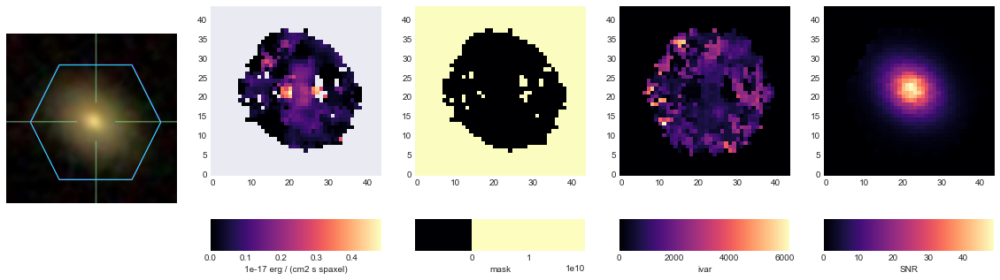

In [33]:
# Make subplot of emission line map, mask and ivar
fig, (ax1, ax2, ax3, ax4, ax5) = plt.subplots(1,5, figsize=(20,6))

im1 = Image('8143-3701')
#im1 = Maps.getImage()
imfn = im1.filename
img = mpimg.imread(imfn)
imgplot = ax1.imshow(img, aspect=1)
ax1.set_xlim(150,400)
ax1.set_ylim(400, 150)
ax1.axis('off')
im1.overlay_hexagon(ax1, color='cyan', linewidth=1)

im2 = ax2.imshow(ha6564fmap_val, vmin=0, vmax=np.nanmax(ha6564fmap_val), origin='lower', 
                 cmap='magma')
fig.colorbar(im2, ax=ax2, label='{}'.format(ha6564flux_map.unit), aspect=5.3, 
             orientation='horizontal')
ax2.set_aspect(1)

im3 = ax3.imshow(ha6564fmap_mask, vmin=0, vmax=ha6564fmap_mask.max(), origin='lower', cmap='magma')
bounds = [0,1e10]
fig.colorbar(im3, ax=ax3, label='{}'.format('mask'), aspect=5.3, 
             orientation='horizontal', boundaries=[0] + bounds + [1e10],
            ticks=bounds)
ax3.set_aspect(1)

im4 = ax4.imshow(ha6564fmap_ivar, vmin=0, vmax=ha6564fmap_ivar.max(), origin='lower', cmap='magma')
fig.colorbar(im4, ax=ax4, label='{}'.format('ivar'), aspect=5.3, orientation='horizontal')
ax4.set_aspect(1)

# SNR spaxel map

# SNR map
snr_map = maps.spx_snr.value

im5 = ax5.imshow(snr_map, vmin=0, vmax=None, origin='lower', cmap='magma')
fig.colorbar(im5, ax=ax5, label='{}'.format('SNR'), aspect=5.3, orientation='horizontal')
ax5.set_aspect(1)


In [34]:
#im.get_new_cutout(30, 30, scale=0.192)
#im.overlay_hexagon(ax, color='cyan', linewidth=1)
#ax = im.plot(with_axes=True)
#ax.overlay_hexagon(ax, color='cyan', linewidth=1)

In [35]:
#a = maps.vacs.HI
#print(a)


## Function to examine emission line fluxes

In [36]:
def examine_emline_maps(flux_map, plateifu, emline_label, vmin=0, vmax=None):
    
    map_val = flux_map.value # flux map
    map_mask = flux_map.mask # mask map
    map_ivar = flux_map.ivar # ivar map
    
    # Mask the emission line and change bad pixels to nan values
    map_val[map_mask !=0]=np.nan
    
    # Plot image, flux map, mask, ivar
    # Make subplot of emission line map, mask and ivar
    fig, (ax1, ax2, ax3, ax4) = plt.subplots(1,4, figsize=(20,6))
    
    # Image
    im1 = Image(plateifu)
    imfn = im1.filename
    img = mpimg.imread(imfn)
    imgplot = ax1.imshow(img, aspect=1)
    #ax1.set_xlim(150,400)
    #ax1.set_ylim(400, 150)
    ax1.axis('off')
    
    # Flux Map
    im2 = ax2.imshow(map_val, vmin=vmin, vmax=vmax, origin='lower', 
                     cmap='magma')
    fig.colorbar(im2, ax=ax2, label='{} {}'.format(emline_label, flux_map.unit), aspect=5.3, 
                 orientation='horizontal')
    ax2.set_aspect(1)
    
    # Mask
    im3 = ax3.imshow(map_mask, vmin=0, vmax=map_mask.max(), origin='lower', cmap='magma')
    bounds = [0,1e10]
    fig.colorbar(im3, ax=ax3, label='{}'.format('mask'), aspect=5.3, 
                 orientation='horizontal', boundaries=[0] + bounds + [1e10],
                ticks=bounds)
    ax3.set_aspect(1)
    
    # Inverse varience
    im4 = ax4.imshow(map_ivar, vmin=0, vmax=map_ivar.max(), origin='lower', cmap='magma')
    fig.colorbar(im4, ax=ax4, label='{}'.format('ivar'), aspect=5.3, orientation='horizontal')
    ax4.set_aspect(1)
    
    plt.show()
    
    
def examine_all_emline_maps(plateifu):
    plateifu = plateifu
    maps = Maps(plateifu=plateifu, mode='local')
    examine_emline_maps(flux_map=maps.emline_gflux_ha_6564, plateifu=plateifu, emline_label='ha6564',vmin=0, vmax=None)
    examine_emline_maps(flux_map=maps.emline_gflux_hb_4862, plateifu=plateifu, emline_label='hb4862',vmin=0, vmax=None)
    examine_emline_maps(flux_map=maps.emline_gflux_nii_6549, plateifu=plateifu, emline_label='nii6549',vmin=0, vmax=None)
    examine_emline_maps(flux_map=maps.emline_gflux_nii_6585, plateifu=plateifu, emline_label='nii6585',vmin=0, vmax=None)
    examine_emline_maps(flux_map=maps.emline_gflux_oiid_3728, plateifu=plateifu, emline_label='oiid3728',vmin=0, vmax=None)
    examine_emline_maps(flux_map=maps.emline_gflux_oiii_4960, plateifu=plateifu, emline_label='oiii4960',vmin=0, vmax=None)
    examine_emline_maps(flux_map=maps.emline_gflux_oiii_5008, plateifu=plateifu, emline_label='oiii5008',vmin=0, vmax=None)



In [37]:
#examine_all_emline_maps('7815-3702')

In [38]:
#plateifu = '8143-3701'
#maps = Maps(plateifu=plateifu, mode='local')
#examine_emline_maps(flux_map=maps.emline_gflux_ha_6564, plateifu=plateifu, emline_label='ha6564',vmin=0, vmax=None)
#examine_emline_maps(flux_map=maps.emline_gflux_hb_4862, plateifu=plateifu, emline_label='hb4862',vmin=0, vmax=None)
#examine_emline_maps(flux_map=maps.emline_gflux_nii_6549, plateifu=plateifu, emline_label='nii6549',vmin=0, vmax=None)
#examine_emline_maps(flux_map=maps.emline_gflux_nii_6585, plateifu=plateifu, emline_label='nii6585',vmin=0, vmax=None)
#examine_emline_maps(flux_map=maps.emline_gflux_oiid_3728, plateifu=plateifu, emline_label='oiid3728',vmin=0, vmax=None)
#examine_emline_maps(flux_map=maps.emline_gflux_oiii_4960, plateifu=plateifu, emline_label='oiii4960',vmin=0, vmax=None)
#examine_emline_maps(flux_map=maps.emline_gflux_oiii_5008, plateifu=plateifu, emline_label='oiii5008',vmin=0, vmax=None)




In [39]:
#for i in bbrd_manga_match['plateifu']:
#    maps = Maps(plateifu=i, mode='local')
#    examine_emline_maps(flux_map=maps.emline_gflux_ha_6564, plateifu=i, emline_label='ha6564', vmin=0, vmax=None)

In [40]:
#import matplotlib.image as mpimg
#im = Image('8143-3701')
#imfn = im.filename
#img = mpimg.imread(imfn)
#imgplot = plt.imshow(img, aspect=1)
#plt.xlim(150,400)
#plt.ylim(150,400)
#im4 = ax4.imshow(im, origin='lower')
#fig.colorbar(im2, ax=ax3, label='{}'.format('ivar'), aspect=5.3, orientation='horizontal')
#ax4.set_aspect(1)

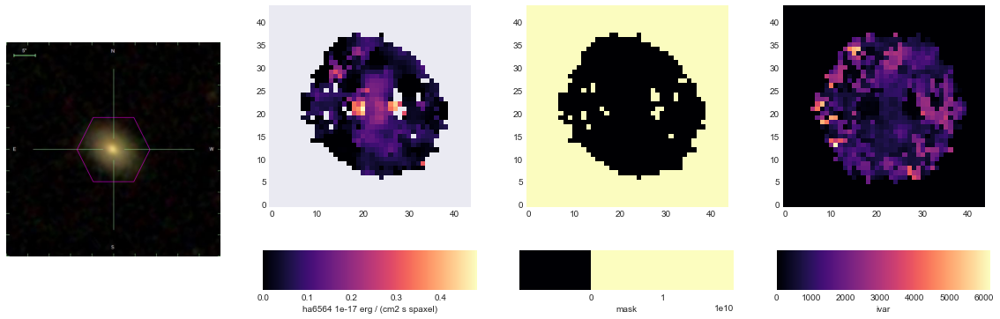

In [41]:
plateifu = '8143-3701'
examine_emline_maps(flux_map=maps.emline_gflux_ha_6564, plateifu=plateifu, emline_label='ha6564',vmin=0, vmax=None)


In [42]:
#fig = px.imshow(ha6564fmap_val, zmin=0, zmax=np.nanmax(ha6564fmap_val), #origin='lower', color_continuous_scale='magma', labels={'color':'1e-17erg/s/#spaxel/cm^2'})
##fig.show()
#
#fig = px.imshow(ha_values, zmin=-0.2, zmax=0.5, origin='lower', #color_continuous_scale='magma', labels={'color':'1e-17erg/s/spaxel/cm^2'})
##fig.show()
#
##spx = maps.getSpaxel(5,0)
##print(spx)

### Using Plotly interactive plots to examine the emission line maps

In [43]:
# Read in emission line flux maps
haflux_map = maps.emline_gflux_ha_6564
hbflux_map = maps.emline_gflux_hb_4862

ha_values = haflux_map.value
hb_values = hbflux_map.value

bdec_map = ha_values / hb_values

[WARNING]: divide by zero encountered in true_divide (RuntimeWarning)
[WARNING]: invalid value encountered in true_divide (RuntimeWarning)


In [44]:
#import plotly.express as px
#import plotly.graph_objects as go
#fig = px.imshow(ha_values, zmin=0, zmax=6, origin='lower', #color_continuous_scale='magma', labels={'color':'1e-17erg/s/spaxel/cm^2'})
#fig.add_trace(go.Contour(z=ha_values, showscale=False,
#                         contours=dict(start=3, end=6, size=70, #coloring='lines'),
#                         line_width=2, name='3-6'))
#fig.show()

In [45]:
#fig = px.imshow(bdec_map, zmin=0, zmax=6, origin='lower', #color_continuous_scale='magma', labels={'color':'1e-17erg/s/spaxel/cm^2'})
#fig.add_trace(go.Contour(z=bdec_map, showscale=False,
#                         contours=dict(start=5, end=11, size=70, #coloring='lines'),
#                         line_width=2, name=None, fillcolor='blue',#autocolorscale=True))
#fig.show()

# Map Extinction correction Calzetti extinction

In [46]:
def c00_k(wavelength, Rv=4.05):
    '''
    Calzetti extinction curve 2000 (Good for starburst like dust)
    Paremeters:
    
        wavelength: float, units of microns
        
        Rv: float, normilaztion of the extinction curve
    '''
    if np.logical_and(wavelength >= 0.63, wavelength <= 2.2):
        #k_lambda = 1.17 * (-1.857 + (1.040/rest_lam)) + 1.78 # Calzetti 2001 obscuration code
        k_lambda = 2.659 * (-1.857 + (1.040/wavelength)) + Rv # Calzetti 2000
        #print('k_lambda={}'.format(k_lambda))
    elif np.logical_and(wavelength >= 0.12, wavelength < 0.63):
        #k_lambda = 1.17 * (-2.156 + (1.509/rest_lam) - (0.198/rest_lam**2) + (0.011/rest_lam**3)) + 1.78 # Calzetti 2001 obscuration code
        k_lambda = 2.659 * (-2.156 + (1.509/wavelength) - (0.198/wavelength**2) + (0.011/wavelength**3)) + Rv
        #print('k_lambda={}'.format(k_lambda))
    else:
        print('Rest wavelength is not in range or not in Angstroms {}'.format(wavelength))
        
    return k_lambda



def balmer_dec(obs_haflux, obs_hbflux):
    '''
    Balmer decrement
    
    Paremeters:
        obs_haflux: float, observed halpha flux
        
        obs_hbflux: float, observed hbeta flux
    '''
    bdec = obs_haflux / obs_hbflux
    return bdec





def c00_kcorr(obs_flux, obs_wavelength, bdec, Rv=4.05):
    '''
    Extinction correction using the Calzetti extinction curve
    
    Paremeter:
        obs_flux: float, Obsereved flux [erg/cm^2/s]
        
        obs_wavelength: float, wavelength [micron]
        
        Rv: float, curve normilization
    '''
    
    # Observe flux
    #print('Observe Flux = {} 1e-17erg/cm/s'.format(obs_flux))
    
    # Observe extinction curve 
    obs_k = c00_k(obs_wavelength, Rv=Rv)
    #print('k({} mircon) = {}'.format(obs_wavelength, obs_k))
    
    # Ha, Hb extinction curve
    k_Ha = c00_k(.6564, Rv)
    #print('k({} mircon) = {}'.format(.6564, k_Ha))
    k_Hb = c00_k(.4864, Rv)
    #print('k({} mircon) = {}'.format(.4864, k_Hb))
    
    # Optical depth tau
    tau = np.log10(bdec / 2.86) # possibly np.log10
    #print('Balmer optical depth={}'.format(tau))
    
    # color excess(gas) - Battisti et al 2017 eqn 2
    EBV_gas = (1.086 / (k_Hb - k_Ha)) * tau 
    EBV_star = EBV_gas * 0.44
    #print('E(B-V)gas={}'.format(EBV_gas))
    #print('E(B-V)star={}'.format(EBV_star))
    
    # Intrinsic flux [erg/cm^2/s]
    int_flux = obs_flux * 10**(0.4 * obs_k * EBV_star)
    #print('intrinsic_flux = {} 1e-17erg/cm^2/s'.format(int_flux))
    #print('')
    
    return int_flux
    





In [47]:
lg12_manga_match_filt['plateifu'].head(10)

9362    8082-6103
6549    8143-3703
3722    8143-1901
4454    9196-1902
5389    8143-3701
9446    8243-6104
8394    8141-6102
5900    7815-3702
9276    7972-6103
9666    8612-6104
Name: plateifu, dtype: object

In [48]:
maps = Maps(plateifu='8612-6104', mode='local')
haflux_map = maps.emline_gflux_ha_6564
hbflux_map = maps.emline_gflux_hb_4862
o3flux_map = maps.emline_gflux_hb_4862

# Mask map values
ha_mask = haflux_map.mask
hb_mask = hbflux_map.mask

ha_val = haflux_map.value
hb_val = hbflux_map.value

ha_val[ha_mask != 0] = np.nan
hb_val[hb_mask != 0] = np.nan

#map_val[map_mask !=0]=np.nan
# Run dust correction on the emission line maps

# Balmer decrement
bdec_map = balmer_dec(ha_val, hb_val)

# Dust correction
ha_mapdc = c00_kcorr(ha_val, .6564, bdec_map, Rv=4.05)
hb_mapdc = c00_kcorr(hb_val, .4864, bdec_map, Rv=4.05)

# ignore true divide error
np.seterr(divide='ignore', invalid='ignore')

[WARNING]: divide by zero encountered in true_divide (RuntimeWarning)
[WARNING]: invalid value encountered in multiply (RuntimeWarning)


{'divide': 'warn', 'over': 'warn', 'under': 'ignore', 'invalid': 'warn'}

## Examine dust corrected maps

In [49]:
#fig = px.imshow(ha_val, zmin=0, zmax=25, origin='lower', color_continuous_scale='magma', labels=#{'color':'1e-17erg/s/spaxel/cm^2'})
#fig.show()
##fig = px.imshow(ha_mask, zmin=0, zmax=None, origin='lower', color_continuous_scale='magma', labels=#{'color':'1e-17erg/s/spaxel/cm^2'})
##fig.show()
#fig = px.imshow(ha_mapdc, zmin=0, zmax=25, origin='lower', color_continuous_scale='magma', labels=#{'color':'1e-17erg/s/spaxel/cm^2'})
#fig.show()

In [50]:
#fig = px.imshow(hb_val, zmin=0, zmax=8, origin='lower', color_continuous_scale='magma', labels=#{'color':'1e-17erg/s/spaxel/cm^2'})
#fig.show()
#fig = px.imshow(hb_mapdc, zmin=0, zmax=8, origin='lower', color_continuous_scale='magma', labels=#{'color':'1e-17erg/s/spaxel/cm^2'})
#fig.show()
#fig = px.imshow(hb_mask, zmin=0, zmax=None, origin='lower', color_continuous_scale='magma', labels=#{'color':'1e-17erg/s/spaxel/cm^2'})
#fig.show()

In [51]:
#fig = px.imshow(bdec_map, zmin=0, zmax=8, origin='lower', color_continuous_scale='magma', labels=#{'color':'1e-17erg/s/spaxel/cm^2'})
#fig.show()

# Calculate SFR and radial profile maps

In [111]:
from astropy.cosmology import FlatLambdaCDM

def sfr(halphadc_map, z):
    #sfr_map = (7.9e-42 * halphadc_map) / 1.53
    
    # Calculate Luminosity distance
    cosmo = FlatLambdaCDM(H0=70 * u.km / u.s / u.Mpc, Tcmb0=2.725 * u.K, Om0=0.3)
    lum_d_mpc = cosmo.luminosity_distance(z)
    lum_d_cm = lum_d_mpc.to(u.cm).value # convert from Mpc to cm
    #print('Lum Distance {} converted to {} cm'.format(lum_d_mpc, lum_d_cm))
    
    #Convert flux to Luminosity
    l_ha = halphadc_map * (4 * np.pi * (lum_d_cm**2))
    #print('Halpha Flux: ',halphadc_map[27,27])
    #print('Halpha Luminosity: ',l_ha[27,27])
    
    #sfr
    sfr_map = (8.79e-42 * l_ha) # Salpeter initial mass function Hao et al. (2011)
    #print('SFR: ',sfr_map[27,27])
    
    #Measeure the diameter of each spaxel with respect to the galaxy distance
    spaxel_diamter_in_kpc = cosmo.kpc_proper_per_arcmin(z).to(u.kpc/u.arcsec) * (0.5 * u.arcsec)
    #print('Diamter of each spaxel (0.5 arcsec) on the galaxy: {}'.format(spaxel_diamter_in_kpc))
    
    #Area of each spaxel
    Area_of_each_spaxels =  4 * np.pi * (spaxel_diamter_in_kpc/2)**2
    #print('Area of each spaxel: {}'.format(Area_of_each_spaxels))
    
    #Calculate the SFRD of each spaxel
    sfrd_map = sfr_map / Area_of_each_spaxels
    #print('SFRD: ',sfrd_map[27,27])
    
    return sfr_map, l_ha, sfrd_map.value, spaxel_diamter_in_kpc, Area_of_each_spaxels


In [53]:
def radius_ratio_map(plateifu):
    '''
    platifu: str 
    
    '''
    #Galaxy effective radius
    Reff = float(Maps(plateifu=plateifu).header['reff'])
    #print('Effective Radius', Reff)
    
    # Galaxy elliptical radius
    R = Maps(plateifu=plateifu).spx_ellcoo_elliptical_radius.value #arcsecs
    #print('Elliptical Radius', R)
    
    #R/Reff
    radius_ratio = R / Reff
    
    return radius_ratio

In [54]:
lg12_manga_match_filt['plateifu'].head(10)

9362    8082-6103
6549    8143-3703
3722    8143-1901
4454    9196-1902
5389    8143-3701
9446    8243-6104
8394    8141-6102
5900    7815-3702
9276    7972-6103
9666    8612-6104
Name: plateifu, dtype: object

In [55]:
bbrd_manga_match['plateifu']

1860     8550-12703
2472     8312-12704
5871     10001-3702
10819     8465-9102
4357      8254-1902
6433      8595-3703
Name: plateifu, dtype: object

In [116]:
def sfr_sfrd_maps(plateifu, sample):
    maps = Maps(plateifu=plateifu, mode='local')
    haflux_map = maps.emline_gflux_ha_6564
    hbflux_map = maps.emline_gflux_hb_4862
    o3flux_map = maps.emline_gflux_hb_4862

    # Mask map values
    ha_mask = haflux_map.mask
    hb_mask = hbflux_map.mask

    ha_val = haflux_map.value
    hb_val = hbflux_map.value

    ha_val[ha_mask != 0] = np.nan
    hb_val[hb_mask != 0] = np.nan

    #map_val[map_mask !=0]=np.nan
    # Run dust correction on the emission line maps

    # Balmer decrement
    bdec_map = balmer_dec(ha_val, hb_val)

    # Dust correction
    ha_mapdc = c00_kcorr(ha_val, .6564, bdec_map, Rv=4.05)
    hb_mapdc = c00_kcorr(hb_val, .4864, bdec_map, Rv=4.05)

    # ignore true divide error
    np.seterr(divide='ignore', invalid='ignore')

    z = maps.nsa['z']
    sfr_map, l_ha, sfrd_map, spaxel_diamter_in_kpc, Area_of_each_spaxels = sfr((ha_mapdc*1e-17), z) 
    radial_map = radius_ratio_map(plateifu)


    # Plot
    # Image
    fig, (ax1,ax2,ax3,ax4,ax5) = plt.subplots(1,5, figsize=(20,5))
    im1 = Image(plateifu)
    imfn = im1.filename
    img = mpimg.imread(imfn)
    imgplot = ax1.imshow(img, aspect=1)
    #ax1.set_xlim(150,400)
    #ax1.set_ylim(400, 150)
    ax1.axis('off')
    ax1.set_title(plateifu)

    # SFR Map
    im2 = ax2.imshow(np.log10(sfr_map), vmin=-6.0, vmax=-1, origin='lower', 
                     cmap='magma')
    fig.colorbar(im2, ax=ax2, label='Log(SFR)[Msun/yr]', aspect=5.3, 
                 orientation='horizontal')
    ax2.set_aspect(1)

    # SFR Radial profile
    im3 = ax3.scatter(radial_map, np.log10(sfr_map), s=1,cmap='magma',c=np.log10(sfr_map), vmin=-6.0, vmax=-1)
    ax3.set_xlabel('R/Reff')
    ax3.set_ylabel('Log(SFR)[Msun/yr]')
    ax3.set_xlim(0.0, 3.0)
    ax3.set_ylim(-6.0, -1.0)
    #fig.colorbar(im3, ax=ax3, label='Log(SFR)[Msun/yr]', aspect=5.3, 
    #             orientation='horizontal')
    #ax3.set_aspect(1)

    # SFRD Radial profile
    im4 = ax4.imshow(np.log10(sfrd_map), vmin=-5.8, vmax=-1, origin='lower', 
                     cmap='magma')
    fig.colorbar(im4, ax=ax4, label='Log(SFRD)[Msun/yr/kpc^-2]', aspect=5.3, 
                 orientation='horizontal')
    ax4.set_aspect(1)

    #SFRD Radial profile
    im5 = ax5.scatter(radial_map, np.log10(sfrd_map), s=1, cmap='magma',c=np.log10(sfrd_map), vmin=-5.8, vmax=-1)
    ax5.set_xlabel('R/Reff')
    ax5.set_ylabel('Log(SFRD)[Msun/yr/kpc^-2]')
    ax5.set_xlim(0.0, 3.0)
    ax5.set_ylim(-6.8, -1.0)
    #fig.colorbar(im5, ax=ax5, label='Log(SFR)[Msun/yr]', aspect=5.3, 
    #             orientation='horizontal')
    #ax5.set_aspect(1)
    fig.tight_layout()

    if sample == 'bbrd':
        plt.savefig('/Users/mmckay/Desktop/research/FMR_MZR/bbrd_sfr_gif/{}_sfr_sfrd.jpg'.format(plateifu))
    elif sample == 'lg12':
        plt.savefig('/Users/mmckay/Desktop/research/FMR_MZR/lg12_sfr_gif/{}_sfr_sfrd.jpg'.format(plateifu))
    else:
        plt.savefig('{}_sfr_sfrd.jpg'.format(plateifu))
    plt.close()
    return sfr_map, lha_map, sfrd_map, radial_map

In [57]:
bbrd_manga_match['plateifu']

1860     8550-12703
2472     8312-12704
5871     10001-3702
10819     8465-9102
4357      8254-1902
6433      8595-3703
Name: plateifu, dtype: object

In [58]:
sfr_map, lha_map, sfrd_map, radial_map = sfr_sfrd_maps('10001-3702', sample='bbrd')

[WARNING]: np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead (DeprecationWarning)


In [59]:
#for ifu in bbrd_manga_match['plateifu']:
#    sfr_sfrd_maps(ifu, sample='bbrd')
#
#for ifu in lg12_manga_match['plateifu']:
#    sfr_sfrd_maps(ifu, sample='lg12')

In [60]:
#Make gif of SFR plots
import glob
from PIL import Image as Image2
# Create the frames
frames = []
frames1 = []
imgs = glob.glob("/Users/mmckay/Desktop/research/FMR_MZR/bbrd_sfr_gif/*_sfr_sfrd.jpg")
imgs1 = glob.glob("/Users/mmckay/Desktop/research/FMR_MZR/lg12_sfr_gif/*_sfr_sfrd.jpg")
#imgs = natural_sort(imgs)
for i in imgs:
    new_frame = Image2.open(i)
    frames.append(new_frame)

for j in imgs1:
    new_frame1 = Image2.open(j)
    frames1.append(new_frame1)

# Save into a GIF file that loops forever
frames[0].save('/Users/mmckay/Desktop/research/FMR_MZR/bbrd_sfr_gif/png_to_gif.gif', format='GIF',
               append_images=frames[1:len(imgs)],
               save_all=True,
               duration=300, loop=0)


frames[0].save('/Users/mmckay/Desktop/research/FMR_MZR/lg12_sfr_gif/png_to_gif.gif', format='GIF',
               append_images=frames1[0:len(imgs1)],
               save_all=True,
               duration=300, loop=0)

## Examine SFR Maps

In [61]:
#sfr_map, lha_map, sfrd_map, radial_map = sfr_sfrd_maps('10001-3702', sample='bbrd')
## 
#fig = px.imshow(np.log10(sfr_map), zmin=None, zmax=None, origin='lower', color_continuous_scale='magma', 
#                labels={'color':'log(Msun/yr-1)'}, title='Log(SFR Map)')
#fig.show()
#
## 
#fig = px.imshow(np.log10(lha_map), zmin=None, zmax=None, origin='lower', color_continuous_scale='magma', 
#                labels={'color':'log(erg/s/spaxel)'}, title='Log(Halpha Luminosity)')
#fig.show()
#
## 
#fig = px.imshow(np.log10(sfrd_map), zmin=None, zmax=None, origin='lower', color_continuous_scale='magma',
#                labels={'color':'log(Msun/yr-1/kpc-2)'}, title='Log(SFRD map)')
#fig.show()

# Metallicity maps

In [62]:
# Kewley and Dopita - 2002 - Using Strong Lines to Estimate Abundances in Extra (KD02)

# NII/OII diagnostic [N II] λ6584/[O II] λ3727
# Note: Independent of ionization parameter, Z>=8.6 for a reliable abundance
def nii_oii(NII_emline_flux, OII_emline_flux):
    R = np.log10(NII_emline_flux / OII_emline_flux)
    Z = np.log10(1.54020 + (1.26602 * R) + (0.167977 * R**2)) + 8.93 # KD02 (eq 5&7) [Z = log(O/H) +12]
    return R, Z



In [63]:
def metal_maps(plateifu, sample):
    #plateifu = '8550-12703'
    maps = Maps(plateifu=plateifu, mode='local')
    nii6549_map = maps.emline_gflux_nii_6549
    nii6585_map = maps.emline_gflux_nii_6585
    oii3727_map = maps.emline_gflux_oii_3727
    oii3729_map = maps.emline_gew_oii_3729
    haflux_map = maps.emline_gflux_ha_6564
    hbflux_map = maps.emline_gflux_hb_4862

    # Mask map values
    nii6549_mask = nii6549_map.mask
    nii6585_mask = nii6585_map.mask
    oii3727_mask = oii3727_map.mask
    oii3729_mask = oii3729_map.mask
    ha_mask = haflux_map.mask
    hb_mask = hbflux_map.mask

    nii6549_val = nii6549_map.value
    nii6585_val = nii6585_map.value
    oii3727_val = oii3727_map.value
    oii3729_val = oii3729_map.value
    ha_val = haflux_map.value
    hb_val = hbflux_map.value


    nii6549_val[nii6549_mask != 0] = np.nan
    nii6585_val[nii6585_mask != 0] = np.nan
    oii3727_val[oii3727_mask != 0] = np.nan
    oii3729_val[oii3729_mask != 0] = np.nan
    ha_val[ha_mask != 0] = np.nan
    hb_val[hb_mask != 0] = np.nan

    # Dust correction
    # Balmer decrement
    bdec_map = balmer_dec(ha_val, hb_val)

    # Dust correction
    ha_mapdc = c00_kcorr(ha_val, .6564, bdec_map, Rv=4.05)
    hb_mapdc = c00_kcorr(hb_val, .4864, bdec_map, Rv=4.05)
    nii6549_mapdc = c00_kcorr(nii6549_val, .6549, bdec_map, Rv=4.05)
    nii6585_mapdc = c00_kcorr(nii6585_val, .6585, bdec_map, Rv=4.05)
    oii3727_mapdc = c00_kcorr(oii3727_val, .3727, bdec_map, Rv=4.05)
    oii3729_mapdc = c00_kcorr(oii3729_val, .3729, bdec_map, Rv=4.05)

    # Measure Metallicity
    nii_oii_ratio_map, metal_map = nii_oii(nii6585_mapdc, oii3727_mapdc)
    radial_map = radius_ratio_map(plateifu)

    #plt.style.use('seaborn-darkgrid')
    plt.style.use('seaborn-dark')
    fig, (ax1,ax2,ax3,ax4,ax5,ax6) = plt.subplots(1,6, figsize=(23,5))

    # Plots
    im1 = Image(plateifu)
    imfn = im1.filename
    img = mpimg.imread(imfn)
    imgplot = ax1.imshow(img, aspect=1)
    ax1.set_title(plateifu)
    #ax1.set_xlim(150,400)
    #ax1.set_ylim(400, 150)
    ax1.axis('off')

    # NII6585
    im2 = ax2.imshow(np.log10(nii6585_mapdc), vmin=-1.0, vmax=2.0, origin='lower', 
                     cmap='magma')
    fig.colorbar(im2, ax=ax2, label='Log(NII) [1e-17*erg/s/cm^-2/spaxel]', aspect=5.3, 
                 orientation='horizontal')
    ax2.set_title('NII6585 Flux DC')
    ax2.set_aspect(1)
    #ax2.grid()

    # OII3727
    im3 = ax3.imshow(np.log10(oii3727_mapdc), vmin=-1.0, vmax=2.0, origin='lower', 
                     cmap='magma')
    fig.colorbar(im3, ax=ax3, label='Log(OII) [1e-17*erg/s/cm^-2/spaxel]', aspect=5.3, 
                 orientation='horizontal')
    ax3.set_title('OII3727 Flux DC')
    ax3.set_aspect(1)
    #ax3.grid()

    #NII/OII ratio
    im4 = ax4.imshow(nii_oii_ratio_map, vmin=0.0, vmax=1.5, origin='lower', 
                     cmap='magma')
    fig.colorbar(im4, ax=ax4, label='NII/OII ratio', aspect=5.3, 
                 orientation='horizontal')
    ax4.set_title('NII/OII ratio')
    ax4.set_aspect(1)
    #ax4.grid()

    # Metallicity Map
    im5 = ax5.imshow(metal_map, vmin=8.8, vmax=9.5, origin='lower', 
                     cmap='magma')
    fig.colorbar(im5, ax=ax5, label='Log(O/H)+12', aspect=5.3, 
                 orientation='horizontal')
    ax5.set_title('Log(O/H)+12')
    ax5.set_aspect(1)
    #ax5.grid()

    # Metallicity Radial profile
    im6 = ax6.scatter(radial_map, metal_map, s=1, color='purple')
    ax6.set_xlabel('R/Reff')
    ax6.set_ylabel('Log(O/H)+12')
    ax6.set_xlim(0.0,3.0)
    ax6.set_ylim(8.6,9.6)
    #fig.colorbar(im6, ax=ax6, label='Log(O/H)+12', aspect=5.3, 
    #             orientation='horizontal')
    #ax6.grid()

    # 
    #im6 = ax6.scatter(radial_map, nii_oii_map, s=1, color='black')
    #ax6.set_xlabel('R/Reff')
    #ax6.set_ylabel('Log(O/H)+12')
    ##fig.colorbar(im6, ax=ax6, label='Log(O/H)+12', aspect=5.3, 
    ##             orientation='horizontal')
    #ax6.grid()


    fig.tight_layout()
    #ax6.set_aspect(1)
    if sample == 'bbrd':
        plt.savefig('/Users/mmckay/Desktop/research/FMR_MZR/bbrd_metal_gif/{}_metal.jpg'.format(plateifu))
    elif sample == 'lg12':
        plt.savefig('/Users/mmckay/Desktop/research/FMR_MZR/lg12_metal_gif/{}_metal.jpg'.format(plateifu))
    else:
        plt.savefig('{}_metal.jpg'.format(plateifu))

    plt.close()
    return metal_map

In [64]:
# metal_map = metal_maps('8550-12703', sample='lg12')

In [65]:
#for ifu in bbrd_manga_match['plateifu']:
#    metal_map = metal_maps(ifu, sample='bbrd')
##
#for ifu in lg12_manga_match['plateifu']:
#    metal_map = metal_maps(ifu, sample='lg12')

In [66]:
#Make gif of SFR plots
import glob
from PIL import Image as Image2
# Create the frames
frames = []
frames1 = []
imgs = glob.glob("/Users/mmckay/Desktop/research/FMR_MZR/bbrd_metal_gif/*_metal.jpg")
imgs1 = glob.glob("/Users/mmckay/Desktop/research/FMR_MZR/lg12_metal_gif/*_metal.jpg")
#imgs = natural_sort(imgs)
for i in imgs:
    new_frame = Image2.open(i)
    frames.append(new_frame)

for j in imgs1:
    new_frame1 = Image2.open(j)
    frames1.append(new_frame1)

# Save into a GIF file that loops forever
frames[0].save('/Users/mmckay/Desktop/research/FMR_MZR/bbrd_metal_gif/png_to_gif.gif', format='GIF',
               append_images=frames[1:len(imgs)],
               save_all=True,
               duration=300, loop=0)


frames[0].save('/Users/mmckay/Desktop/research/FMR_MZR/lg12_metal_gif/png_to_gif.gif', format='GIF',
               append_images=frames1[0:len(imgs1)],
               save_all=True,
               duration=300, loop=0)

# Examine metallicity and emline maps

In [67]:
# Metallicity Map
#fig = px.imshow(metal_maps, zmin=8.9, zmax=9.5, origin='lower', color_continuous_scale='magma', 
#                labels={'color':'Log(O/H)+12'}, title='Log(O/H)+12')
#fig.show()
# NII6549
#fig = px.imshow(nii6549_mapdc, zmin=0, zmax=1.5, origin='lower', color_continuous_scale='magma', 
#                labels={'color':'erg/s/cm^-2/spaxel'}, title='NII6549 flux DC')
#fig.show()
## NII6585
#fig = px.imshow(nii6585_mapdc, zmin=0, zmax=1.5, origin='lower', color_continuous_scale='magma', 
#                labels={'color':'erg/s/cm^-2/spaxel'}, title='NII6585 flux DC')
##fig.show()
#
## OII3727
#fig = px.imshow(oii3727_mapdc, zmin=None, zmax=None, origin='lower', color_continuous_scale='magma', 
#                labels={'color':'erg/s/cm^-2/spaxel'}, title='OII3727 flux DC')
##fig.show()
#
## OII3729
#fig = px.imshow(oii3729_mapdc, zmin=0, zmax=10, origin='lower', color_continuous_scale='magma', 
#                labels={'color':'erg/s/cm^-2/spaxel'}, title='OII3729 flux DC')
##fig.show()


# BPT function

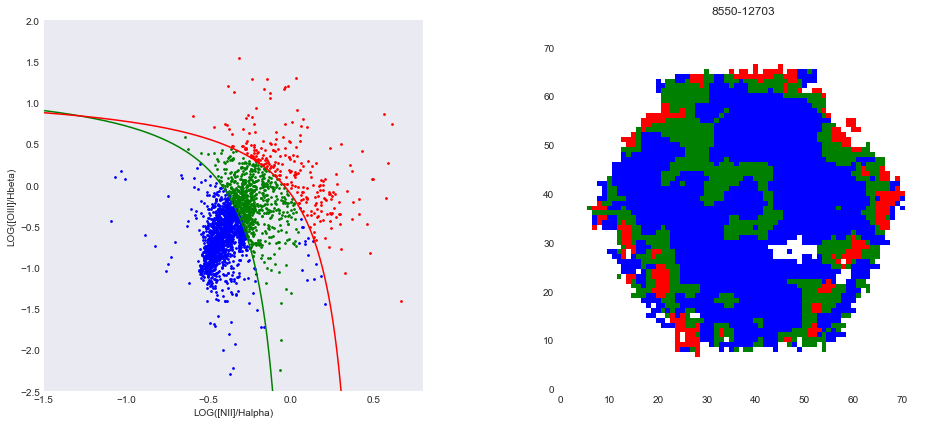

In [68]:
plateifu = '8550-12703'
maps = Maps(plateifu=plateifu, mode='local')

nii6549_map = maps.emline_gflux_nii_6549
nii6585_map = maps.emline_gflux_nii_6585
oii3727_map = maps.emline_gflux_oii_3727
oii3729_map = maps.emline_gew_oii_3729
haflux_map = maps.emline_gflux_ha_6564
hbflux_map = maps.emline_gflux_hb_4862
o3_5008_map = maps.emline_gflux_oiii_5008



# Mask map values
nii6549_mask = nii6549_map.mask
nii6585_mask = nii6585_map.mask
oii3727_mask = oii3727_map.mask
oii3729_mask = oii3729_map.mask
o3_5008_mask = o3_5008_map.mask
ha_mask = haflux_map.mask
hb_mask = hbflux_map.mask

nii6549_val = nii6549_map.value
nii6585_val = nii6585_map.value
oii3727_val = oii3727_map.value
oii3729_val = oii3729_map.value
o3_5008_val = o3_5008_map.value
ha_val = haflux_map.value
hb_val = hbflux_map.value


nii6549_val[nii6549_mask != 0] = np.nan
nii6585_val[nii6585_mask != 0] = np.nan
oii3727_val[oii3727_mask != 0] = np.nan
oii3729_val[oii3729_mask != 0] = np.nan
o3_5008_val[o3_5008_mask != 0] = np.nan
ha_val[ha_mask != 0] = np.nan
hb_val[hb_mask != 0] = np.nan

# Dust correction
# Balmer decrement
bdec_map = balmer_dec(ha_val, hb_val)

# Dust correction
ha_mapdc = c00_kcorr(ha_val, .6564, bdec_map, Rv=4.05)
hb_mapdc = c00_kcorr(hb_val, .4864, bdec_map, Rv=4.05)
nii6549_mapdc = c00_kcorr(nii6549_val, .6549, bdec_map, Rv=4.05)
nii6585_mapdc = c00_kcorr(nii6585_val, .6585, bdec_map, Rv=4.05)
oii3727_mapdc = c00_kcorr(oii3727_val, .3727, bdec_map, Rv=4.05)
oii3729_mapdc = c00_kcorr(oii3729_val, .3729, bdec_map, Rv=4.05)
o3_5008_mapdc = c00_kcorr(o3_5008_val, .5008, bdec_map, Rv=4.05)

# OIII/Hbeta, NII/halpha extinction corrected
o3hb_ratio = np.log10(o3_5008_mapdc / hb_mapdc)
n2ha_ratio = np.log10(nii6585_mapdc / ha_mapdc)

# OIII/Hbeta, NII/halpha non-extinction corrected
o3hb_ratio_ne = np.log10(o3_5008_val / hb_val)
n2ha_ratio_ne = np.log10(nii6585_val / ha_val)

# Plot kewley03 sf fit and Kauf01-sf+comp fit
n2ha_sf_range = np.linspace(-2.0,0.045,int(1e4))
n2ha_comp_range = np.linspace(-2.0,0.4,int(1e4))
ka03_comp = (0.61 / (n2ha_sf_range - 0.05)) + 1.3
ke01_sf = (0.61 / (n2ha_comp_range - 0.47)) + 1.19

# classify spaxels 
agn_mask = (o3hb_ratio > (0.61 / (n2ha_ratio - 0.47)) + 1.19) | (n2ha_ratio>0.4)
comp_mask =(o3hb_ratio <= (0.61 / (n2ha_ratio - 0.47)) + 1.19) & (o3hb_ratio >= (0.61 / (n2ha_ratio - 0.05)) + 1.3) 
sf_mask = (o3hb_ratio <= (0.61 / (n2ha_ratio - 0.05)) + 1.3) & (o3hb_ratio <= (0.61 / (n2ha_ratio - 0.47)) + 1.19) & (n2ha_ratio<=0.4) 
#sf_mask = o3hb_ratio[~agn_mask]

# Combine mask to create BPT image
sf_mask_num = np.where(sf_mask==True, 1, sf_mask)
comp_mask_num = np.where(comp_mask==True, 2, comp_mask)
agn_mask_num = np.where(agn_mask==True, 3, agn_mask)
combo_mask_num = agn_mask_num + sf_mask_num + comp_mask_num

# Plot BPT plots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))
ax1.plot(n2ha_sf_range, ka03_comp, color='green', label='ka03')
ax1.plot(n2ha_comp_range, ke01_sf, color='red', label='ke01')
#ax1.scatter(n2ha_ratio, o3hb_ratio, s=3)
ax1.scatter(n2ha_ratio[agn_mask], o3hb_ratio[agn_mask], s=3, color='red')
ax1.scatter(n2ha_ratio[comp_mask], o3hb_ratio[comp_mask], s=3, color='green')
ax1.scatter(n2ha_ratio[sf_mask], o3hb_ratio[sf_mask], s=3, color='blue')
ax1.set_ylim(-2.5,2.0)
ax1.set_xlim(-1.5,0.8)
ax1.set_xlabel('LOG([NII]/Halpha)')
ax1.set_ylabel('LOG([OIII]/Hbeta)')
ax1.set_aspect(0.5)

from matplotlib import colors

# make a color map of fixed colors
cmap = colors.ListedColormap(['white','blue', 'green', 'red','grey','orange'])
bounds=[0,1,2,3,4,5]
norm = colors.BoundaryNorm(bounds, cmap.N)
# tell imshow about color map so that only set colors are used
img = ax2.imshow(combo_mask_num, interpolation='nearest', origin='lower',
                    cmap=cmap, norm=norm)
# make a color bar
#plt.colorbar(img, cmap=cmap, norm=norm, boundaries=bounds, ticks=bounds, ax=ax2)
ax2.set_title(plateifu)
ax2.set_aspect(1)
fig.tight_layout()
plt.savefig('{}_bpt.jpg'.format(plateifu))
plt.show()


#fig, (ax1) = plt.subplots(1, 1, figsize=(7, 6), sharey=True)
#ax1.plot(n2ha_sf_range, ka03_comp, color='green', label='ka03')
#ax1.plot(n2ha_comp_range, ke01_sf, color='red', label='ke01')
#ax1.scatter(n2ha_ratio_ne, o3hb_ratio_ne, s=3)
##ax1.scatter(n2ha_ratio[agn_mask], o3hb_ratio[agn_mask], s=3, color='red')
##ax1.scatter(n2ha_ratio[comp_mask], o3hb_ratio[comp_mask], s=3, color='green')
##ax1.scatter(n2ha_ratio[sf_mask], o3hb_ratio[sf_mask], s=3, color='orange')
#ax1.set_ylim(-2.5,2.0)
#ax1.set_xlabel('LOG([NII]/Halpha)')
#ax1.set_ylabel('LOG([OIII]/Hbeta)')
#plt.show()




In [69]:
n2ha_ratio[agn_mask==True]=np.nan
n2ha_ratio.shape

(76, 76)

In [70]:
sf_mask_num = np.where(sf_mask==True, 1, sf_mask)
comp_mask_num = np.where(comp_mask==True, 2, comp_mask)
agn_mask_num = np.where(agn_mask==True, 3, agn_mask)
combo_mask_num = agn_mask_num + sf_mask_num + comp_mask_num


[WARNING]: The 'cmap' parameter to Colorbar has no effect because it is overridden by the mappable; it is deprecated since 3.3 and will be removed two minor releases later. (MatplotlibDeprecationWarning)
[WARNING]: The 'norm' parameter to Colorbar has no effect because it is overridden by the mappable; it is deprecated since 3.3 and will be removed two minor releases later. (MatplotlibDeprecationWarning)


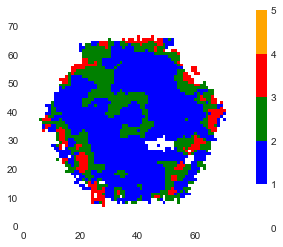

In [71]:


# make a color map of fixed colors
cmap = colors.ListedColormap(['white','blue', 'green', 'red','grey','orange'])
bounds=[0,1,2,3,4,5]
norm = colors.BoundaryNorm(bounds, cmap.N)
# tell imshow about color map so that only set colors are used
img = plt.imshow(combo_mask_num, interpolation='nearest', origin='lower',
                    cmap=cmap, norm=norm)
# make a color bar
plt.colorbar(img, cmap=cmap, norm=norm, boundaries=bounds, ticks=bounds)
plt.show()

In [72]:
#fig = px.imshow(combo_mask_num, zmin=None, zmax=None, origin='lower', color_continuous_scale=[
#    (1.0, "red"), (1.9, "red"), 
#    (2.0, "green"), (2.9, "green"),
#    (3.0, "blue"),  (3.1, "blue")], 
#                labels={'color':''}, title='combo mask')
#fig.show()

In [73]:
#fig = px.imshow(combo_mask_num, zmin=None, zmax=None, origin='lower', color_continuous_scale=[
#    [1.0,'blue'],[2.0,'green'], [3.0,'red'], 'twilight'
#    ], 
#                labels={'color':''}, title='combo mask')
#fig.show()

In [74]:
#fig = px.imshow(agn_mask_num, zmin=None, zmax=None, origin='lower', color_continuous_scale='magma', 
#                labels={'color':''}, title='agn mask')
#fig.show()
#fig = px.imshow(sf_mask_num, zmin=None, zmax=None, origin='lower', color_continuous_scale='magma', 
#                labels={'color':''}, title='sf mask')
#fig.show()

In [75]:
#plt.imshow(agn_mask, cmap='gray')
#plt.imshow(comp_mask, alpha=0.5, cmap='viridis')
#plt.imshow(sf_mask, alpha=0.7, cmap='jet')

# Marvin BPT

In [76]:
#masks, fig, axes = maps.get_bpt(show_plot=True)

In [77]:
#sf_mask.shape

In [78]:
#masks, fig, axes = maps.get_bpt(show_plot=False)
#sf_mask = masks['sf']['nii']
#comp_mask = masks['comp']['nii']
#agn_mask = masks['agn']['nii']
#ambig_mask = masks['ambiguous']['global']
#
#fig, (ax1,ax2) = plt.subplots(1, 2, figsize=(12, 5))
#ax1.plot(n2ha_sf_range, ka03_comp, color='green', label='ka03')
#ax1.plot(n2ha_comp_range, ke01_sf, color='red', label='ke01')
##ax1.scatter(n2ha_ratio, o3hb_ratio, s=3)
#ax1.scatter(n2ha_ratio_ne[agn_mask], o3hb_ratio_ne[agn_mask], s=10, color='red')
#ax1.scatter(n2ha_ratio_ne[comp_mask], o3hb_ratio_ne[comp_mask], s=10, color='green')
#ax1.scatter(n2ha_ratio_ne[sf_mask], o3hb_ratio_ne[sf_mask], s=10, color='blue')
#ax1.scatter(n2ha_ratio_ne[ambig_mask], o3hb_ratio_ne[ambig_mask], s=10, color='orange')
#ax1.set_ylim(-2.5,2.0)
#ax1.set_xlabel('LOG([NII]/Halpha)')
#ax1.set_ylabel('LOG([OIII]/Hbeta)')
#
##ax1.plot(n2ha_sf_range, ka03_comp, color='green', label='ka03')
##ax1.plot(n2ha_comp_range, ke01_sf, color='red', label='ke01')
##ax1.scatter(n2ha_ratio, o3hb_ratio, s=3)
##ax1.scatter(n2ha_ratio_ne[agn_mask], o3hb_ratio_ne[agn_mask], s=10, color='red')
##ax1.scatter(n2ha_ratio_ne[comp_mask], o3hb_ratio_ne[comp_mask], s=10, color='green')
##ax1.scatter(n2ha_ratio_ne[sf_mask], o3hb_ratio_ne[sf_mask], s=10, color='blue')
##ax1.scatter(n2ha_ratio_ne[ambig], o3hb_ratio_ne[ambig], s=10, color='orange')
#im2 = ax2.imshow(sf_mask, cmap='magma', origin='lower')
##ax2.imshow(comp_mask, cmap='magma')
#ax2.set_aspect(1)
#fig.colorbar(im2, ax=ax2, label='1e-17*erg/s/cm^-2/spaxel', aspect=5.3, 
#             orientation='horizontal')
#ax2.set_title('NII6585 Flux DC')
#ax2.set_aspect(1)
#ax2.grid()
##ax2.set_ylim(-2.5,2.0)
#plt.show()

In [79]:
#im1 = plt.imshow((sf_mask), cmap='magma', origin='lower')
#im2 = plt.imshow(comp_mask, cmap='magma', origin='lower')

In [80]:
#fig = px.imshow(sf_mask, zmin=None, zmax=None, origin='lower', color_continuous_scale='magma', 
#                labels={'color':'Log(O/H)+12'}, title='Log(O/H)+12')
#fig.show()
#fig = px.imshow(comp_mask, zmin=None, zmax=None, origin='lower', color_continuous_scale='magma', 
#                labels={'color':'Log(O/H)+12'}, title='Log(O/H)+12')
#fig.show()
#fig = px.imshow(agn_mask, zmin=None, zmax=None, origin='lower', color_continuous_scale='magma', 
#                labels={'color':'Log(O/H)+12'}, title='Log(O/H)+12')
#fig = px.imshow(ambig_mask, zmin=None, zmax=None, origin='lower', color_continuous_scale='magma', 
#                labels={'color':'Log(O/H)+12'}, title='Log(O/H)+12')
#fig.show()

# Log(O/H)+12 vs SFR


In [115]:
# Function
def sfr_z_maps(plateifu):
    #plateifu = '8550-12703'
    maps = Maps(plateifu=plateifu, mode='local')
    nii6549_map = maps.emline_gflux_nii_6549
    nii6585_map = maps.emline_gflux_nii_6585
    oii3727_map = maps.emline_gflux_oii_3727
    oii3729_map = maps.emline_gew_oii_3729
    haflux_map = maps.emline_gflux_ha_6564
    hbflux_map = maps.emline_gflux_hb_4862
    
    # Mask map values
    nii6549_mask = nii6549_map.mask
    nii6585_mask = nii6585_map.mask
    oii3727_mask = oii3727_map.mask
    oii3729_mask = oii3729_map.mask
    ha_mask = haflux_map.mask
    hb_mask = hbflux_map.mask
    
    nii6549_val = nii6549_map.value
    nii6585_val = nii6585_map.value
    oii3727_val = oii3727_map.value
    oii3729_val = oii3729_map.value
    ha_val = haflux_map.value
    hb_val = hbflux_map.value
    
    
    nii6549_val[nii6549_mask != 0] = np.nan
    nii6585_val[nii6585_mask != 0] = np.nan
    oii3727_val[oii3727_mask != 0] = np.nan
    oii3729_val[oii3729_mask != 0] = np.nan
    ha_val[ha_mask != 0] = np.nan
    hb_val[hb_mask != 0] = np.nan
    
    # Dust correction
    # Balmer decrement
    bdec_map = balmer_dec(ha_val, hb_val)
    
    # Dust correction
    ha_mapdc = c00_kcorr(ha_val, .6564, bdec_map, Rv=4.05)
    hb_mapdc = c00_kcorr(hb_val, .4864, bdec_map, Rv=4.05)
    nii6549_mapdc = c00_kcorr(nii6549_val, .6549, bdec_map, Rv=4.05)
    nii6585_mapdc = c00_kcorr(nii6585_val, .6585, bdec_map, Rv=4.05)
    oii3727_mapdc = c00_kcorr(oii3727_val, .3727, bdec_map, Rv=4.05)
    oii3729_mapdc = c00_kcorr(oii3729_val, .3729, bdec_map, Rv=4.05)
    
    # Metallicity map (NII/OII)
    nii_oii_ratio_map, metal_map = nii_oii(nii6585_mapdc, oii3727_mapdc)
    
    #Reff/R ratio map
    radial_map = radius_ratio_map(plateifu)
    
    # SFR, Luminosity, SFRD Map
    z = maps.nsa['z']
    sfr_map, l_ha, sfrd_map, spaxel_diamter_in_kpc, Area_of_each_spaxels = sfr((ha_mapdc*1e-17), z) 

    return metal_map, radial_map, sfr_map


In [82]:
def bpt_map(plateifu):
    maps = Maps(plateifu=plateifu, mode='local')

    nii6549_map = maps.emline_gflux_nii_6549
    nii6585_map = maps.emline_gflux_nii_6585
    oii3727_map = maps.emline_gflux_oii_3727
    oii3729_map = maps.emline_gew_oii_3729
    haflux_map = maps.emline_gflux_ha_6564
    hbflux_map = maps.emline_gflux_hb_4862
    o3_5008_map = maps.emline_gflux_oiii_5008



    # Mask map values
    nii6549_mask = nii6549_map.mask
    nii6585_mask = nii6585_map.mask
    oii3727_mask = oii3727_map.mask
    oii3729_mask = oii3729_map.mask
    o3_5008_mask = o3_5008_map.mask
    ha_mask = haflux_map.mask
    hb_mask = hbflux_map.mask

    nii6549_val = nii6549_map.value
    nii6585_val = nii6585_map.value
    oii3727_val = oii3727_map.value
    oii3729_val = oii3729_map.value
    o3_5008_val = o3_5008_map.value
    ha_val = haflux_map.value
    hb_val = hbflux_map.value


    nii6549_val[nii6549_mask != 0] = np.nan
    nii6585_val[nii6585_mask != 0] = np.nan
    oii3727_val[oii3727_mask != 0] = np.nan
    oii3729_val[oii3729_mask != 0] = np.nan
    o3_5008_val[o3_5008_mask != 0] = np.nan
    ha_val[ha_mask != 0] = np.nan
    hb_val[hb_mask != 0] = np.nan

    # Dust correction
    # Balmer decrement
    bdec_map = balmer_dec(ha_val, hb_val)

    # Dust correction
    ha_mapdc = c00_kcorr(ha_val, .6564, bdec_map, Rv=4.05)
    hb_mapdc = c00_kcorr(hb_val, .4864, bdec_map, Rv=4.05)
    nii6549_mapdc = c00_kcorr(nii6549_val, .6549, bdec_map, Rv=4.05)
    nii6585_mapdc = c00_kcorr(nii6585_val, .6585, bdec_map, Rv=4.05)
    oii3727_mapdc = c00_kcorr(oii3727_val, .3727, bdec_map, Rv=4.05)
    oii3729_mapdc = c00_kcorr(oii3729_val, .3729, bdec_map, Rv=4.05)
    o3_5008_mapdc = c00_kcorr(o3_5008_val, .5008, bdec_map, Rv=4.05)

    # OIII/Hbeta, NII/halpha extinction corrected
    o3hb_ratio = np.log10(o3_5008_mapdc / hb_mapdc)
    n2ha_ratio = np.log10(nii6585_mapdc / ha_mapdc)

    # OIII/Hbeta, NII/halpha non-extinction corrected
    o3hb_ratio_ne = np.log10(o3_5008_val / hb_val)
    n2ha_ratio_ne = np.log10(nii6585_val / ha_val)

    # Plot kewley03 sf fit and Kauf01-sf+comp fit
    n2ha_sf_range = np.linspace(-2.0,0.045,int(1e4))
    n2ha_comp_range = np.linspace(-2.0,0.4,int(1e4))
    ka03_comp = (0.61 / (n2ha_sf_range - 0.05)) + 1.3
    ke01_sf = (0.61 / (n2ha_comp_range - 0.47)) + 1.19

    # classify spaxels 
    agn_mask = (o3hb_ratio > (0.61 / (n2ha_ratio - 0.47)) + 1.19) | (n2ha_ratio>0.4)
    comp_mask =(o3hb_ratio <= (0.61 / (n2ha_ratio - 0.47)) + 1.19) & (o3hb_ratio >= (0.61 / (n2ha_ratio - 0.05))    + 1.3) 
    sf_mask = (o3hb_ratio <= (0.61 / (n2ha_ratio - 0.05)) + 1.3) & (o3hb_ratio <= (0.61 / (n2ha_ratio - 0.47)) +    1.19) & (n2ha_ratio<=0.4) 
    #sf_mask = o3hb_ratio[~agn_mask]

    # Combine mask to create BPT image
    sf_mask_num = np.where(sf_mask==True, 1, sf_mask)
    comp_mask_num = np.where(comp_mask==True, 2, comp_mask)
    agn_mask_num = np.where(agn_mask==True, 3, agn_mask)
    combo_mask_num = agn_mask_num + sf_mask_num + comp_mask_num

    return sf_mask, comp_mask, agn_mask, combo_mask_num, o3hb_ratio, n2ha_ratio

In [83]:
def sfr_z_plots(plateifu, sample):
    metal_map, radial_map, sfr_map = sfr_z_maps(plateifu)
    sf_mask, comp_mask, agn_mask, combo_mask_num, o3hb_ratio, n2ha_ratio = bpt_map(plateifu) # BPT map
    fig, ((ax1,ax2,ax3,ax4),(ax5,ax6,ax7,ax8)) = plt.subplots(2,4, figsize=(15,6))

    im1 = Image(plateifu)
    imfn = im1.filename
    img = mpimg.imread(imfn)
    imgplot = ax1.imshow(img, aspect=1.0)
    #ax1.set_xlim(150,400)
    #ax1.set_ylim(400, 150)
    ax1.axis('off')
    ax1.set_title(plateifu)


    # SFR
    im2 = ax2.imshow(np.log10(sfr_map), vmin=-6, vmax=-1.75, origin='lower', 
                     cmap='magma')
    fig.colorbar(im2, ax=ax2, label='Log(SFR) Msun/yr', aspect=5.3, 
                 orientation='vertical')
    ax2.set_title('SFR')
    #ax2.set_aspect(1)
    #ax2.grid()

    # Log(O/H)+12
    im3 = ax3.imshow(metal_map, vmin=8.8, vmax=9.4, origin='lower', 
                     cmap='magma')
    fig.colorbar(im3, ax=ax3, label='Log(O/H)+12', aspect=5.3, 
                 orientation='vertical')
    ax3.set_title('Log(O/H)+12')
    #ax3.set_aspect(1)
    #ax3.grid()

    # SFR vs Log(O/H)+12
    im4 = ax4.imshow(metal_map, vmin=8.8, vmax=9.4, origin='lower', 
                     cmap='magma')
    fig.colorbar(im4, ax=ax4, label='Log(O/H)+12', aspect=5.3, 
                 orientation='vertical')
    ax4.set_title('Log(O/H)+12')
    ax4.contour(np.log10(sfr_map), vmin=-3, vmax=-1, colors='black', inline=True, fontsize=8)


    # BPT plot
    from matplotlib import colors
    # make a color map of fixed colors
    cmap = colors.ListedColormap(['white','blue', 'green', 'red','grey','orange'])
    bounds=[0,1,2,3,4,5]
    norm = colors.BoundaryNorm(bounds, cmap.N)
    # tell imshow about color map so that only set colors are used
    im5 = ax5.imshow(combo_mask_num, interpolation='nearest', origin='lower',
                        cmap=cmap, norm=norm)
    # make a color bar
    #plt.colorbar(img, cmap=cmap, norm=norm, boundaries=bounds, ticks=bounds, ax=ax2)
    #ax5.set_aspect(1)
    ax5.set_title('BPT Map')
    #plt.show()

    # SFR radial profile 
    im6 = ax6.scatter(radial_map, np.log10(sfr_map), s=1, c=metal_map, cmap='magma', vmin=8.8, vmax=9.4)
    ax6.set_xlabel('R/Reff')
    ax6.set_ylabel('Log(SFR) Msun/yr')
    fig.colorbar(im6, ax=ax6, label='Log(O/H)+12', aspect=5.3, 
                 orientation='vertical')
    ax6.grid()
    ax6.set_ylim(-6.0, -1.75)
    ax6.set_xlim(0.0,3.0)
    #ax6.set_aspect(1)

    # Log(O/H)+12 radial profile 
    im7 = ax7.scatter(radial_map, metal_map, s=1, c=np.log10(sfr_map), cmap='magma', vmin=-6.0, vmax=-1.75)
    ax7.set_xlabel('R/Reff')
    ax7.set_ylabel('Log(O/H)+12')
    fig.colorbar(im7, ax=ax7, label='Log(SFR) Msun/yr', aspect=5.3, 
                 orientation='vertical')
    ax7.grid()
    ax7.set_ylim(8.8,9.6)
    ax7.set_xlim(0.0,3.0)
    #ax7.set_aspect(1)

    im8 = ax8.scatter(np.log10(sfr_map), metal_map, c=radial_map, cmap='magma', s=1, vmin=0.0, vmax=3.0)
    fig.colorbar(im8, ax=ax8, label='Log(SFR) Msun/yr', aspect=5.3, 
                 orientation='vertical')
    ax8.set_xlabel('Log(SFR) Msun/yr')
    ax8.set_ylabel('Log(O/H)+12')
    ax8.set_xlim(-6.0, -1.75)
    ax8.set_ylim(8.8, 9.6)
    #ax8.set_aspect(1)
    ax8.grid()


    fig.tight_layout()
    #ax6.set_aspect(1)
    if sample == 'bbrd':
        plt.savefig('/Users/mmckay/Desktop/research/FMR_MZR/bbrd_bpt_sfr_Z_gif/{}_bpt_sfr_Z.jpg'.format(plateifu))
    elif sample == 'lg12':
        plt.savefig('/Users/mmckay/Desktop/research/FMR_MZR/lg12_bpt_sfr_Z_gif/{}_bpt_sfr_Z.jpg'.format(plateifu))
    else:
        plt.savefig('{}_bpt_sfr_Z.jpg'.format(plateifu))
    plt.close()

In [84]:
#sfr_z_plots('8550-12703', sample='bbrd')

In [85]:
#for ifu in bbrd_manga_match['plateifu']:
#    sfr_z_plots(ifu, sample='bbrd')
#
#
#for ifu in lg12_manga_match['plateifu']:
#    sfr_z_plots(ifu, sample='lg12')
#


In [86]:
#Make gif of SFR plots
import glob
from PIL import Image as Image2
# Create the frames
frames = []
frames1 = []
imgs = glob.glob("/Users/mmckay/Desktop/research/FMR_MZR/bbrd_bpt_sfr_Z_gif/*_bpt_sfr_Z.jpg")
imgs1 = glob.glob("/Users/mmckay/Desktop/research/FMR_MZR/lg12_bpt_sfr_Z_gif/*_bpt_sfr_Z.jpg")
#imgs = natural_sort(imgs)
for i in imgs:
    new_frame = Image2.open(i)
    frames.append(new_frame)

for j in imgs1:
    new_frame1 = Image2.open(j)
    frames1.append(new_frame1)

# Save into a GIF file that loops forever
frames[0].save('/Users/mmckay/Desktop/research/FMR_MZR/bbrd_bpt_sfr_Z_gif/png_to_gif.gif', format='GIF',
               append_images=frames[1:len(imgs)],
               save_all=True,
               duration=300, loop=0)


frames[0].save('/Users/mmckay/Desktop/research/FMR_MZR/lg12_bpt_sfr_Z_gif/png_to_gif.gif', format='GIF',
               append_images=frames1[0:len(imgs1)],
               save_all=True,
               duration=300, loop=0)

# Multiple Metallicity Measurments

In [87]:
# Kewley and Dopita - 2002 - Using Strong Lines to Estimate Abundances in Extra (KD02)
# NII/OII diagnostic [N II] λ6584/[O II] λ3727
# Note: Independent of ionization parameter, Z>=8.6 for a reliable abundance
def nii_oii(NII_emline_flux, OII_emline_flux):
    R = np.log10(NII_emline_flux / OII_emline_flux)
    Z = np.log10(1.54020 + (1.26602 * R) + (0.167977 * R**2)) + 8.93 # KD02 (eq 5&7) [Z = log(O/H) +12]
    return R, Z


def n2o2_metal_map(plateifu):
    maps = Maps(plateifu=plateifu, mode='local')
    nii6585_map = maps.emline_gflux_nii_6585
    oii3727_map = maps.emline_gflux_oii_3727
    oii3729_map = maps.emline_gew_oii_3729
    haflux_map = maps.emline_gflux_ha_6564
    hbflux_map = maps.emline_gflux_hb_4862

    # Mask map values
    nii6585_mask = nii6585_map.mask
    oii3727_mask = oii3727_map.mask
    oii3729_mask = oii3729_map.mask
    ha_mask = haflux_map.mask
    hb_mask = hbflux_map.mask

    # Emission line values
    nii6585_val = nii6585_map.value
    oii3727_val = oii3727_map.value
    oii3729_val = oii3729_map.value
    ha_val = haflux_map.value
    hb_val = hbflux_map.value

    nii6585_val[nii6585_mask != 0] = np.nan
    oii3727_val[oii3727_mask != 0] = np.nan
    oii3729_val[oii3729_mask != 0] = np.nan
    ha_val[ha_mask != 0] = np.nan
    hb_val[hb_mask != 0] = np.nan

    
    # Balmer decrement
    bdec_map = balmer_dec(ha_val, hb_val)

    # Dust correction
    nii6585_mapdc = c00_kcorr(nii6585_val, .6585, bdec_map, Rv=4.05)
    oii3727_mapdc = c00_kcorr(oii3727_val, .3727, bdec_map, Rv=4.05)
    oii3729_mapdc = c00_kcorr(oii3729_val, .3729, bdec_map, Rv=4.05)


    # Kewley and Dopita - 2002 - Using Strong Lines to Estimate Abundances in Extra (KD02)
    # NII/OII diagnostic [N II] λ6584/[O II] λ3727,3729
    # Note: Independent of ionization parameter, Z>=8.6 for a reliable abundance
    ratio_map = np.log10(nii6585_mapdc / (oii3727_mapdc+oii3729_mapdc))
    metal_map = np.log10(1.54020 + (1.26602 * ratio_map) + (0.167977 * ratio_map**2)) + 8.93 # KD02 (eq 5&7) [Z = log(O/H) +12]
    return ratio_map, metal_map

def o3n2_metal_map(plateifu):
    maps = Maps(plateifu=plateifu, mode='local')
    o3_5008_map = maps.emline_gflux_oiii_5008
    nii6585_map = maps.emline_gflux_nii_6585
    haflux_map = maps.emline_gflux_ha_6564
    hbflux_map = maps.emline_gflux_hb_4862

    # Mask map values
    o3_5008_mask = o3_5008_map.mask
    nii6585_mask = nii6585_map.mask
    ha_mask = haflux_map.mask
    hb_mask = hbflux_map.mask

    # Emission line values
    o3_5008_val = o3_5008_map.value
    nii6585_val = nii6585_map.value
    ha_val = haflux_map.value
    hb_val = hbflux_map.value

    # Masking values
    o3_5008_val[o3_5008_mask != 0] = np.nan
    nii6585_val[nii6585_mask != 0] = np.nan
    ha_val[ha_mask != 0] = np.nan
    hb_val[hb_mask != 0] = np.nan

    
    # Balmer decrement
    bdec_map = balmer_dec(ha_val, hb_val)

    # Dust correction
    o3_5008_mapdc = c00_kcorr(o3_5008_val, .5008, bdec_map, Rv=4.05)
    nii6585_mapdc = c00_kcorr(nii6585_val, .6585, bdec_map, Rv=4.05)
    ha_mapdc = c00_kcorr(ha_val, .6564, bdec_map, Rv=4.05)
    hb_mapdc = c00_kcorr(hb_val, .4864, bdec_map, Rv=4.05)


    # Marino et al. 2013 O3N2 diagnostic
    # O3N2 diagnostic [OIII]λ5007/Hbeta * Halpha/[NII]λ6583
    ratio_map = np.log10((o3_5008_mapdc/hb_mapdc) * (ha_mapdc / nii6585_mapdc))
    metal_map = 8.505 - 0.221 * ratio_map
    return ratio_map, metal_map

def n2_metal_map(plateifu):
    maps = Maps(plateifu=plateifu, mode='local')
    nii6585_map = maps.emline_gflux_nii_6585
    haflux_map = maps.emline_gflux_ha_6564
    hbflux_map = maps.emline_gflux_hb_4862

    # Mask map values
    nii6585_mask = nii6585_map.mask
    ha_mask = haflux_map.mask
    hb_mask = hbflux_map.mask

    # Emission line values
    nii6585_val = nii6585_map.value
    ha_val = haflux_map.value
    hb_val = hbflux_map.value

    # Masking values
    nii6585_val[nii6585_mask != 0] = np.nan
    ha_val[ha_mask != 0] = np.nan
    hb_val[hb_mask != 0] = np.nan

    
    # Balmer decrement
    bdec_map = balmer_dec(ha_val, hb_val)

    # Dust correction
    nii6585_mapdc = c00_kcorr(nii6585_val, .6585, bdec_map, Rv=4.05)
    ha_mapdc = c00_kcorr(ha_val, .6564, bdec_map, Rv=4.05)
    hb_mapdc = c00_kcorr(hb_val, .4864, bdec_map, Rv=4.05)

    # Marino et al. 2013 N2 diagnostic
    # N2 diagnostic log([NII]λ6583/Halpha)
    ratio_map = np.log10(nii6585_mapdc / ha_mapdc)
    metal_map = 8.667 - 0.455 * ratio_map
    return ratio_map, metal_map


def n2s2_metal_map(plateifu):
    maps = Maps(plateifu=plateifu, mode='local')
    nii6585_map = maps.emline_gflux_nii_6585
    sii6718_map = maps.emline_gflux_sii_6718
    sii6732_map = maps.emline_gflux_sii_6732
    haflux_map = maps.emline_gflux_ha_6564
    hbflux_map = maps.emline_gflux_hb_4862

    # Mask map values
    nii6585_mask = nii6585_map.mask
    sii6718_mask = nii6585_map.mask
    sii6732_mask = sii6732_map.mask
    ha_mask = haflux_map.mask
    hb_mask = hbflux_map.mask

    # Emission line values
    nii6585_val = nii6585_map.value
    sii6718_val = sii6718_map.value
    sii6732_val = sii6732_map.value
    ha_val = haflux_map.value
    hb_val = hbflux_map.value

    # Masking values
    nii6585_val[nii6585_mask != 0] = np.nan
    sii6718_val[sii6718_mask != 0] = np.nan
    sii6732_val[sii6732_mask != 0] = np.nan
    ha_val[ha_mask != 0] = np.nan
    hb_val[hb_mask != 0] = np.nan

    
    # Balmer decrement
    bdec_map = balmer_dec(ha_val, hb_val)

    # Dust correction
    nii6585_mapdc = c00_kcorr(nii6585_val, .6585, bdec_map, Rv=4.05)
    sii6718_mapdc = c00_kcorr(sii6718_val, .6718, bdec_map, Rv=4.05)
    sii6732_mapdc = c00_kcorr(sii6732_val, .6732, bdec_map, Rv=4.05)
    ha_mapdc = c00_kcorr(ha_val, .6564, bdec_map, Rv=4.05)
    hb_mapdc = c00_kcorr(hb_val, .4864, bdec_map, Rv=4.05)

    # Marino et al. 2013 N2 diagnostic
    # N2S2 diagnostic log([NII]λ6583/Halpha)
    n2_ratio_map, n2_Z_map = n2_metal_map(plateifu)
    ratio_map = np.log10(nii6585_mapdc / (sii6718_mapdc + sii6732_mapdc))
    metal_map = 8.77 + ratio_map + 0.264 * n2_Z_map
    return ratio_map, metal_map



In [88]:
def line_best_fit(x, y, deg):
    # Flatten 2D array
    x1 = x.flatten()
    y1 = y.flatten()
    
    # Remove nan values
    #x2 = x1[~np.isnan(x1)]

    y2 = y1[~np.isnan(y1) & ~np.isinf(y1)]
    x2 = x1[~np.isnan(y1) & ~np.isinf(y1)]
    #print(x2.shape, x2.max())
    #print(y2.shape, y2.max())

    m, b = np.polyfit(x2, y2, deg)
    y3 = (m * x2) + b
    return m, b, x2, y3



def sfr_Z_line_fit(x, y, deg):
    
    # Flatten 2D array
    x1 = x.flatten()
    y1 = y.flatten()

    # Remove nan values
    y2 = y1[~np.isnan(y1) & ~np.isinf(y1)]
    x2 = x1[~np.isnan(y1) & ~np.isinf(y1)]
    #print(x2.shape, x2.max())
    #print(y2.shape, y2.max())


    y3 = y2[~np.isnan(x2) & ~np.isinf(x2)]
    x3 = x2[~np.isnan(x2) & ~np.isinf(x2)]
    #print(x3.shape, x3.max())
    #print(y3.shape, y3.max())


    m, b = np.polyfit(x3, y3, deg)
    y4 = (m * x3) + b
    return m, b, x3, y4

In [117]:
import seaborn as sns
def all_sfrd_Z_plots(plateifu, sample=''):
    '''
    plateifu id

    Z - metallicity diagnostic
    n2o2, o3n2, n2, n2s2
    '''
    # Read in maps
    maps = Maps(plateifu=plateifu, mode='local')

    # Reff/R ratio map
    radial_map = radius_ratio_map(plateifu)

    # Dust correct for Halpha
    haflux_map = maps.emline_gflux_ha_6564
    hbflux_map = maps.emline_gflux_hb_4862

    ha_mask = haflux_map.mask
    hb_mask = hbflux_map.mask

    ha_val = haflux_map.value
    hb_val = hbflux_map.value

    ha_val[ha_mask != 0] = np.nan
    hb_val[hb_mask != 0] = np.nan

    # Balmer decrement
    bdec_map = balmer_dec(ha_val, hb_val)
    ha_mapdc = c00_kcorr(ha_val, .6564, bdec_map, Rv=4.05)

    # SFR, Luminosity, SFRD Map
    z = maps.nsa['z']
    sfr_map, l_ha, sfrd_map, spaxel_diamter_in_kpc, Area_of_each_spaxels = sfr((ha_mapdc*1e-17), z)

    #if Z == 'n2o2':
    #    # N2O2 Metallicity
    #    n2o2_ratio_map, n2o2_Z_map = n2o2_metal_map(plateifu)
    #elif Z == 'o3n2':
    #    # O3N2
    #    o3n2_ratio_map, o3n2_Z_map = o3n2_metal_map(plateifu)
    #elif Z == 'n2':
    #    # N2
    #    n2_ratio_map, n2_Z_map = n2_metal_map(plateifu)
    #elif Z == 'n2s2':
    #    # N2S2
    #    n2s2_ratio_map, n2s2_Z_map = n2s2_metal_map(plateifu)

    # N2O2 Metallicity
    n2o2_ratio_map, n2o2_Z_map = n2o2_metal_map(plateifu)
    # O3N2
    o3n2_ratio_map, o3n2_Z_map = o3n2_metal_map(plateifu)
    # N2
    n2_ratio_map, n2_Z_map = n2_metal_map(plateifu)
    # N2S2
    n2s2_ratio_map, n2s2_Z_map = n2s2_metal_map(plateifu)

    # BPT
    sf_mask, comp_mask, agn_mask, combo_mask_num, o3hb_ratio, n2ha_ratio = bpt_map(plateifu)

    # plot the data 
    fig, ((ax1,ax2,ax3,ax4,ax5,ax6), 
    (ax7,ax8,ax9,ax10,ax11,ax12), 
    (ax13,ax14,ax15,ax16,ax17,ax18), 
    (ax19,ax20,ax21,ax22,ax23,ax24)) = plt.subplots(4,6, figsize=(30,14))
    

    # Image
    im1 = Image(plateifu)
    imfn = im1.filename
    img = mpimg.imread(imfn)
    imgplot = ax1.imshow(img, aspect=1.0)
    #ax1.set_xlim(150,400)
    #ax1.set_ylim(400, 150)
    ax1.axis('off')
    ax1.set_title(plateifu, fontsize=14)

    # SFR Map
    im2 = ax2.imshow(np.log10(sfr_map), vmin=-6, vmax=-1.75, origin='lower', 
                     cmap='magma')
    fig.colorbar(im2, ax=ax2, label='Log(SFR) Msun/yr', aspect=5.3, orientation='vertical')
    ax2.set_title('SFR', fontsize=14)
    #ax2.set_aspect(1)
    #ax2.grid()

    # N2O2 Map
    im3 = ax3.imshow(n2o2_Z_map, vmin=8.6, vmax=9.1, origin='lower', 
                     cmap='magma')
    fig.colorbar(im3, ax=ax3, label='Log(O/H)+12', aspect=5.3, orientation='vertical')
    ax3.set_title('Log(O/H)+12 [N2O2]', fontsize=14)
    #ax3.set_aspect(1)
    #ax3.grid()

    # O3N2 Map
    im4 = ax4.imshow(o3n2_Z_map, vmin=None, vmax=None, origin='lower', 
                     cmap='magma')
    fig.colorbar(im4, ax=ax4, label='Log(O/H)+12', aspect=5.3, orientation='vertical')
    ax4.set_title('Log(O/H)+12 [O3N2]', fontsize=14)
    #ax3.set_aspect(1)
    #ax3.grid()

    # N2 Map
    im5 = ax5.imshow(n2_Z_map, vmin=None, vmax=None, origin='lower', 
                     cmap='magma')
    fig.colorbar(im5, ax=ax5, label='Log(O/H)+12', aspect=5.3, orientation='vertical')
    ax5.set_title('Log(O/H)+12 [N2]', fontsize=14)
    #ax3.set_aspect(1)
    #ax3.grid()
    
    # N2S2 Map
    im6 = ax6.imshow(n2s2_Z_map, vmin=None, vmax=None, origin='lower', 
                     cmap='magma')
    fig.colorbar(im6, ax=ax6, label='Log(O/H)+12', aspect=5.3, orientation='vertical')
    ax6.set_title('Log(O/H)+12 [N2S2]', fontsize=14)
    #ax3.set_aspect(1)
    #ax3.grid()

    # BPT Map
    # make a color map of fixed colors
    cmap = colors.ListedColormap(['white','blue', 'green', 'red','grey','orange'])
    bounds=[0,1,2,3,4,5]
    norm = colors.BoundaryNorm(bounds, cmap.N)
    # tell imshow about color map so that only set colors are used
    im7 = ax7.imshow(combo_mask_num, interpolation='nearest', origin='lower',
                        cmap=cmap, norm=norm)
    # make a color bar
    #plt.colorbar(img, cmap=cmap, norm=norm, boundaries=bounds, ticks=bounds, ax=ax2)
    #ax7.set_aspect(1)
    ax7.set_title('BPT Map', fontsize=14)
    #plt.show()

    # SFR radial profile 
    im8 = ax8.scatter(radial_map, np.log10(sfr_map), s=1, c=n2o2_Z_map, cmap='magma', vmin=8.8, vmax=9.4)
    ax8.set_xlabel('R/Reff', fontsize=14)
    ax8.set_ylabel('Log(SFR) Msun/yr', fontsize=14)
    fig.colorbar(im8, ax=ax8, label='Log(O/H)+12 [N2O2]', aspect=5.3, orientation='vertical')
    ax8.grid()
    #ax8.set_ylim(-6.0, -1.25)
    #ax8.set_xlim(0.0, 3.5)
    #sns.scatterplot(radial_map, np.log10(sfr_map), )
    m, b, x, y = line_best_fit(radial_map, np.log10(sfr_map), 1)
    sns.regplot(x=x, y=y, ax=ax8, scatter=False, color='red', label='slope = {} \n y-int = {}'.format(np.round(m, 3),np.round(b, 3)))
    #ax8.plot(x, y)
    ax8.legend()
    


    # N2O2 radial profile 
    im9 = ax9.scatter(radial_map, n2o2_Z_map, s=1, c=np.log10(sfr_map), cmap='magma', vmin=-6.0, vmax=-1.75)
    ax9.set_xlabel('R/Reff', fontsize=14)
    ax9.set_ylabel('Log(O/H)+12', fontsize=14)
    ax9.grid()
    fig.colorbar(im9, ax=ax9, label='Log(SFR) Msun/yr', aspect=5.3, orientation='vertical')
    m, b, x, y = line_best_fit(radial_map, n2o2_Z_map, 1)
    sns.regplot(x=x, y=y, ax=ax9, scatter=False, color='red', label='slope = {} \n y-int = {}'.format(np.round(m, 3),np.round(b, 3)))
    ax9.legend()

    # O3N2 radial profile 
    im10 = ax10.scatter(radial_map, o3n2_Z_map, s=1, c=np.log10(sfr_map), cmap='magma', vmin=-6.0, vmax=-1.75)
    ax10.set_xlabel('R/Reff', fontsize=14)
    ax10.set_ylabel('Log(O/H)+12', fontsize=14)
    fig.colorbar(im10, ax=ax10, label='Log(SFR) Msun/yr', aspect=5.3, orientation='vertical')
    ax10.grid()
    m, b, x, y = line_best_fit(radial_map, o3n2_Z_map, 1)
    sns.regplot(x=x, y=y, ax=ax10, scatter=False, color='red', label='slope = {} \n y-int = {}'.format(np.round(m, 3),np.round(b, 3)))
    ax10.legend()

    # N2 radial profile 
    im11 = ax11.scatter(radial_map, n2_Z_map, s=1, c=np.log10(sfr_map), cmap='magma', vmin=-6.0, vmax=-1.75)
    ax11.set_xlabel('R/Reff', fontsize=14)
    ax11.set_ylabel('Log(O/H)+12', fontsize=14)
    fig.colorbar(im11, ax=ax11, label='Log(SFR) Msun/yr', aspect=5.3, orientation='vertical')
    ax11.grid()
    m, b, x, y = line_best_fit(radial_map, n2_Z_map, 1)
    sns.regplot(x=x, y=y, ax=ax11, scatter=False, color='red', label='slope = {} \n y-int = {}'.format(np.round(m, 3),np.round(b, 3)))
    ax11.legend()

    # N2S2 radial profile 
    im12 = ax12.scatter(radial_map, n2s2_Z_map, s=1, c=np.log10(sfr_map), cmap='magma', vmin=-6.0, vmax=-1.75)
    ax12.set_xlabel('R/Reff', fontsize=14)
    ax12.set_ylabel('Log(O/H)+12', fontsize=14)
    fig.colorbar(im12, ax=ax12, label='Log(SFR) Msun/yr', aspect=5.3, orientation='vertical')
    ax12.grid()
    m, b, x, y = line_best_fit(radial_map, n2s2_Z_map, 1)
    sns.regplot(x=x, y=y, ax=ax12, scatter=False, color='red', label='slope = {} \n y-int = {}'.format(np.round(m, 3),np.round(b, 3)))
    ax12.legend()


    # BPT Plot
    # Plot kewley03 sf fit and Kauf01-sf+comp fit
    n2ha_sf_range = np.linspace(-2.0,0.045,int(1e4))
    n2ha_comp_range = np.linspace(-2.0,0.4,int(1e4))
    ka03_comp = (0.61 / (n2ha_sf_range - 0.05)) + 1.3
    ke01_sf = (0.61 / (n2ha_comp_range - 0.47)) + 1.19

    ax13.plot(n2ha_sf_range, ka03_comp, color='green', label='ka03')
    ax13.plot(n2ha_comp_range, ke01_sf, color='red', label='ke01')
    #ax1.scatter(n2ha_ratio, o3hb_ratio, s=3)
    ax13.scatter(n2ha_ratio[agn_mask], o3hb_ratio[agn_mask], s=3, color='red')
    ax13.scatter(n2ha_ratio[comp_mask], o3hb_ratio[comp_mask], s=3, color='green')
    ax13.scatter(n2ha_ratio[sf_mask], o3hb_ratio[sf_mask], s=3, color='blue')
    #ax13.scatter(n2ha_ratio, o3hb_ratio, s=3, color='blue')
    ax13.set_ylim(-2.5,2.0)
    ax13.set_xlim(-1.5,0.8)
    ax13.set_xlabel('LOG([NII]/Halpha)', fontsize=14)
    ax13.set_ylabel('LOG([OIII]/Hbeta)', fontsize=14)
    ax13.set_aspect(0.5)
    ax13.grid()


    # SFRD
    im14 = ax14.imshow(np.log10(sfrd_map), vmin=None, vmax=None, origin='lower', 
                     cmap='magma')
    fig.colorbar(im14, ax=ax14, label='SFRD [Mstar/yr/kpc-2]', aspect=5.3, orientation='vertical')
    ax14.set_title('SFRD [Mstar/yr/kpc-2]', fontsize=14)

    

    # N2O2 Map
    im15 = ax15.imshow(n2o2_Z_map, vmin=None, vmax=None, origin='lower', 
                     cmap='magma')
    fig.colorbar(im15, ax=ax15, label='Log(O/H)+12', aspect=5.3, orientation='vertical')
    ax15.set_title('Log(O/H)+12 [N2O2]', fontsize=14)
    ax15.contour(np.log10(sfrd_map), vmin=-3, vmax=-1, colors='black', inline=True, fontsize=8)
    #ax3.set_aspect(1)
    #ax3.grid()

    # O3N2 Map
    im16 = ax16.imshow(o3n2_Z_map, vmin=None, vmax=None, origin='lower', 
                     cmap='magma')
    fig.colorbar(im16, ax=ax16, label='Log(O/H)+12', aspect=5.3, orientation='vertical')
    ax16.set_title('Log(O/H)+12 [O3N2]', fontsize=14)
    ax16.contour(np.log10(sfrd_map), vmin=-3, vmax=-1, colors='black', inline=True, fontsize=8)
    #ax3.set_aspect(1)
    #ax3.grid()

    # N2 Map
    im17 = ax17.imshow(n2_Z_map, vmin=None, vmax=None, origin='lower', 
                     cmap='magma')
    fig.colorbar(im17, ax=ax17, label='Log(O/H)+12', aspect=5.3, orientation='vertical')
    ax17.set_title('Log(O/H)+12 [N2]', fontsize=14)
    ax17.contour(np.log10(sfrd_map), vmin=-3, vmax=-1, colors='black', inline=True, fontsize=8)
    #ax3.set_aspect(1)
    #ax3.grid()

    # N2S2 Map
    im18 = ax18.imshow(n2s2_Z_map, vmin=None, vmax=None, origin='lower', 
                     cmap='magma')
    fig.colorbar(im18, ax=ax18, label='Log(O/H)+12', aspect=5.3, orientation='vertical')
    ax18.set_title('Log(O/H)+12 [N2S2]', fontsize=14)
    ax18.contour(np.log10(sfrd_map), vmin=-3, vmax=-1, colors='black', inline=True, fontsize=8)
    #ax3.set_aspect(1)
    #ax3.grid()

    # SNR Maps
    snr_map = maps.spx_snr.value

    im19 = ax19.imshow(snr_map, vmin=0, vmax=None, origin='lower', cmap='magma')
    fig.colorbar(im19, ax=ax19, label='{}'.format('SNR'), aspect=5.3, orientation='vertical')
    ax19.set_aspect(1)
    ax19.set_title('SNR map')


    # SFRD radial profile 
    im20 = ax20.scatter(radial_map, np.log10(sfrd_map), s=1, c=np.log10(sfrd_map), cmap='magma', vmin=-6.0, vmax=-1.75)
    ax20.set_xlabel('R/Reff', fontsize=14)
    ax20.set_ylabel('SFRD [Mstar/yr/kpc-2]', fontsize=14)
    fig.colorbar(im20, ax=ax20, label='SFRD [Mstar/yr/kpc-2]', aspect=5.3, orientation='vertical')
    ax20.grid()
    m_sfrd, b, x, y = line_best_fit(radial_map, np.log10(sfrd_map), 1)
    sns.regplot(x=x, y=y, ax=ax20, scatter=False, color='red', label='slope = {} \n y-int = {}'.format(np.round(m_sfrd, 3),np.round(b, 3)))
    ax20.legend()

    # SFRD vs N2O2
    im21 = ax21.scatter(np.log10(sfrd_map), n2o2_Z_map, s=1, c=radial_map, cmap='magma', vmin=0, vmax=3.0)
    ax21.set_ylabel('Log(O/H)+12 [N2O2]', fontsize=14)
    ax21.set_xlabel('SFRD [Mstar/yr/kpc-2]', fontsize=14)
    fig.colorbar(im21, ax=ax21, label='R/Reff', aspect=5.3, 
                 orientation='vertical')
    ax21.grid()
    m_n2o2, b, x, y = sfr_Z_line_fit(np.log10(sfrd_map), n2o2_Z_map, 1)
    sns.regplot(x=x, y=y, ax=ax21, scatter=False, color='red', label='slope = {} \n y-int = {}'.format(np.round(m_n2o2, 3),np.round(b, 3)))
    ax21.legend()

    # SFRD vs O3N2
    im22 = ax22.scatter(np.log10(sfrd_map), o3n2_Z_map, s=1, c=radial_map, cmap='magma', vmin=0, vmax=3.0)
    ax22.set_ylabel('Log(O/H)+12 [O3N2]', fontsize=14)
    ax22.set_xlabel('SFRD [Mstar/yr/kpc-2]', fontsize=14)
    fig.colorbar(im22, ax=ax22, label='R/Reff', aspect=5.3, 
                 orientation='vertical')
    ax22.grid()
    m_o3n2, b, x, y = sfr_Z_line_fit(np.log10(sfrd_map), o3n2_Z_map,  1)
    sns.regplot(x=x, y=y, ax=ax22, scatter=False, color='red', label='slope = {} \n y-int = {}'.format(np.round(m_o3n2, 3),np.round(b, 3)))
    ax22.legend()

    # SFRD vs N2
    im23 = ax23.scatter(np.log10(sfrd_map), n2_Z_map, s=1, c=radial_map, cmap='magma', vmin=0, vmax=3.0)
    ax23.set_ylabel('Log(O/H)+12 [O3N2]', fontsize=14)
    ax23.set_xlabel('SFRD [Mstar/yr/kpc-2]', fontsize=14)
    fig.colorbar(im23, ax=ax23, label='R/Reff', aspect=5.3, 
                 orientation='vertical')
    ax23.grid()
    m_n2, b, x, y = sfr_Z_line_fit(np.log10(sfrd_map), n2_Z_map, 1)
    sns.regplot(x=x, y=y, ax=ax23, scatter=False, color='red', label='slope = {} \n y-int = {}'.format(np.round(m_n2, 3),np.round(b, 3)))
    ax23.legend()

    # SFRD vs N2S2
    im24 = ax24.scatter(np.log10(sfrd_map), n2s2_Z_map, s=1, c=radial_map, cmap='magma', vmin=0, vmax=3.0)
    ax24.set_ylabel('Log(O/H)+12 [N2S2]', fontsize=14)
    ax24.set_xlabel('SFRD [Mstar/yr/kpc-2]', fontsize=14)
    fig.colorbar(im24, ax=ax24, label='R/Reff', aspect=5.3, 
                 orientation='vertical')
    ax24.grid()
    m_n2s2, b, x, y = sfr_Z_line_fit(np.log10(sfrd_map), n2s2_Z_map, 1)
    sns.regplot(x=x, y=y, ax=ax24, scatter=False, color='red', label='slope = {} \n y-int = {}'.format(np.round(m_n2s2, 3),np.round(b, 3)))
    ax24.legend()


    fig.tight_layout()


    if sample == 'bbrd':
        plt.savefig('/Users/mmckay/Desktop/research/FMR_MZR/bbrd_full_map/{}_all_plots.jpeg'.format(plateifu))
    elif sample == 'lg12':
        plt.savefig('/Users/mmckay/Desktop/research/FMR_MZR/lg12_full_map/{}_all_plots.jpeg'.format(plateifu))
    else:
        plt.savefig('{}_full_map.jpeg'.format(plateifu))
    plt.close()

    return m_sfrd, m_n2o2, m_o3n2, m_n2, m_n2s2, np.log10(sfrd_map), n2o2_Z_map, o3n2_Z_map, n2_Z_map, n2s2_Z_map, spaxel_diamter_in_kpc, Area_of_each_spaxels

In [118]:
# Test
m_sfrd, m_n2o2, m_o3n2, m_n2, m_n2s2, sfrd_map, n2o2_Z_map, o3n2_Z_map, n2_Z_map, n2s2_Z_map, spaxel_diamter_in_kpc, Area_of_each_spaxels = all_sfrd_Z_plots('8143-1901', sample='lg12')
print(m_sfrd, m_n2o2, m_o3n2, m_n2, m_n2s2)

[WARNING]: np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead (DeprecationWarning)
[WARNING]: The following kwargs were not used by contour: 'inline', 'fontsize' (UserWarning)
-0.7438983792119396 0.6214695856788061 -0.038035083331857095 0.008091223445443703 0.26436080153626507


In [91]:
#bbrd_m_sfrd_list = []
#bbrd_m_n2o2_list = []
#bbrd_m_o3n2_list = []
#bbrd_m_n2_list = []
#bbrd_m_n2s2_list = []
#for ifu in bbrd_manga_match['plateifu']:
#    m_sfrd, m_n2o2, m_o3n2, m_n2, m_n2s2, sfrd_map, n2o2_Z_map, o3n2_Z_map, n2_Z_map,# n2s2_Z_map = all_sfrd_Z_plots(ifu, sample='bbrd')
#    bbrd_m_sfrd_list.append(m_sfrd)
#    bbrd_m_n2o2_list.append(m_n2o2)
#    bbrd_m_o3n2_list.append(m_o3n2)
#    bbrd_m_n2_list.append(m_n2)
#    bbrd_m_n2s2_list.append(m_n2s2)
#
#lg12_m_sfrd_list = []
#lg12_m_n2o2_list = []
#lg12_m_o3n2_list = []
#lg12_m_n2_list = []
#lg12_m_n2s2_list = []
#for ifu in lg12_manga_match_filt['plateifu']:
#    m_sfrd, m_n2o2, m_o3n2, m_n2, m_n2s2, sfrd_map, n2o2_Z_map, o3n2_Z_map, n2_Z_map,# n2s2_Z_map = all_sfrd_Z_plots(ifu, sample='lg12')
#    lg12_m_sfrd_list.append(m_sfrd)
#    lg12_m_n2o2_list.append(m_n2o2)
#    lg12_m_o3n2_list.append(m_o3n2)
#    lg12_m_n2_list.append(m_n2)
#    lg12_m_n2s2_list.append(m_n2s2)
#fig, ((ax1,ax2,ax3,ax4,ax5)) = plt.subplots(1, 5, figsize=(20,4))
## SFRD
#sns.distplot(bbrd_m_sfrd_list, bins=10, ax=ax1, rug=True, hist=False)
#sns.distplot(lg12_m_sfrd_list, bins=10, ax=ax1, rug=True, hist=False, color='coral')
#ax1.set_title('BBRD SFRD slope dist')
#ax1.set_ylabel('Frequency')
#ax1.set_xlabel('Slope')
#ax1.set_xlim(-2.5,1)
#
## N2O2
#sns.distplot(bbrd_m_n2o2_list, bins=10, ax=ax2, rug=True, hist=False)
#sns.distplot(lg12_m_n2o2_list, bins=10, ax=ax2, rug=True, hist=False, color='coral')
#ax2.set_title('N2O2 slope dist')
#ax2.set_ylabel('Frequency')
#ax2.set_xlabel('Slope')
#ax2.set_xlim(-1.0,1.5)
#
## O3N2
#sns.distplot(bbrd_m_o3n2_list, bins=10, ax=ax3, rug=True, hist=False)
#sns.distplot(lg12_m_o3n2_list, bins=10, ax=ax3, rug=True, hist=False, color='coral')
#ax3.set_title('O3N2 slope dist')
#ax3.set_ylabel('Frequency')
#ax3.set_xlabel('Slope')
#ax3.set_xlim(-0.4, 0.2)
#
## N2
#sns.distplot(bbrd_m_n2_list, bins=10, ax=ax4, rug=True, hist=False)
#sns.distplot(lg12_m_n2_list, bins=10, ax=ax4, rug=True, hist=False, color='coral')
#ax4.set_title('N2 slope dist')
#ax4.set_ylabel('Frequency')
#ax4.set_xlabel('Slope')
#ax4.set_xlim(-0.2, 0.6)
#
## N2S2
#sns.distplot(bbrd_m_n2s2_list, bins=10, ax=ax5, rug=True, hist=False)
#sns.distplot(lg12_m_n2s2_list, bins=10, ax=ax5, rug=True, hist=False, color='coral')
#ax5.set_title('N2S2 slope dist')
#ax5.set_ylabel('Frequency')
#ax5.set_xlabel('Slope')
#ax5.set_xlim(-0.6, 0.4)
#
#fig.tight_layout()
#plt.savefig('/Users/mmckay/Desktop/research/FMR_MZR/SFRD_vs_Z_slope_dist.jpeg')

# Platifu csv file

In [93]:
lg12_csv = lg12_manga_match_filt['plateifu'].to_csv('/Users/mmckay/Desktop/research/FMR_MZR/lg12_matched_plateifu_list.csv')
bbrd_csv = bbrd_manga_match['plateifu'].to_csv('/Users/mmckay/Desktop/research/FMR_MZR/bbrd_matched_plateifu_list.csv')

# Pipe3D
# Stellar Mass Maps 

In [94]:
# Download Pipe3d data locally
#import os 
#lg12_plateifu = np.array(lg12_manga_match_filt['plateifu'])
#for ifu in lg12_plateifu:
#    plate = ifu.split('-')[0]
#    print(ifu)
#    os.system('rsync -lv rsync://data.sdss.org/dr14/manga/spectro/pipe3d/v2_1_2/#2.1.2/{}/manga-{}.Pipe3D.cube.fits.gz /Users/mmckay/Desktop/research/FMR_MZR/#lg12_pipe3d_fits'.format(plate, ifu))

In [95]:
def pipe3d_maps(plateifu, sample='lg12'):
    '''
    Parameters:
        plateifu: str
            MaNGA plateifu
    
    Return:
    age_l, age_Z, age_err, stel_vel, vel_err, v_disp, v_err, ml_ratio, mass_density
    '''

    hdu = fits.open('/Users/mmckay/Desktop/research/FMR_MZR/{}_pipe3d_fits/manga-{}.Pipe3D.cube.fits'.format(sample, plateifu))
    age_l = hdu[1].data[5,:,:] # Gyr - Luminosity Weighted age
    age_m = hdu[1].data[6,:,:] # Gyr - Mass Weighted age 
    age_err =  hdu[1].data[7,:,:] # Gyr - Error of the age
    metal_l = hdu[1].data[8,:,:] # km/s
    metal_m = hdu[1].data[9,:,:] # km/s
    metal_err =   hdu[1].data[10,:,:] # km/s
    stel_vel = hdu[1].data[13,:,:] # km/s
    vel_err = hdu[1].data[14,:,:] # km/s
    v_disp = hdu[1].data[15,:,:] # km/s
    v_err = hdu[1].data[16,:,:] # km/s error
    ml_ratio = hdu[1].data[17,:,:] # Msun/Lsun
    mass_density = hdu[1].data[19,:,:] # Msun/spaxe;^2 dust corrected

    hdu.close()

    return age_l, age_m, metal_l, metal_m, metal_err, age_err, stel_vel, vel_err, v_disp, v_err, ml_ratio, mass_density
    


In [119]:
def pipe3d_plots(plateifu, sample):
    #plateifu = plateifu
    age_l, age_m, metal_l, metal_m, metal_err, age_err, stel_vel, vel_err, v_disp, v_err, ml_ratio, mass_density = pipe3d_maps(plateifu=plateifu, sample=sample)
    maps = Maps(plateifu)
    radius_map = radius_ratio_map(plateifu)
    m_sfrd, m_n2o2, m_o3n2, m_n2, m_n2s2, sfrd_map, n2o2_Z_map, o3n2_Z_map, n2_Z_map, n2s2_Z_map, spaxel_diamter_in_kpc, Area_of_each_spaxels = all_sfrd_Z_plots(plateifu, sample=sample)
    
    
    
    
    fig, ((ax1,ax2,ax3,ax4,ax5,ax6), 
    (ax7,ax8,ax9,ax10,ax11,ax12)) = plt.subplots(2,6, figsize=(30,7))

    # Age_L map
    im1 = ax1.imshow(age_l, vmin=8.5, vmax=10, origin='lower', cmap='magma')
    fig.colorbar(im1, ax=ax1, label='$Age\_L$[Gyr]', aspect=5.3, orientation='vertical')
    ax1.set_title('Age - L weighted [Gyr]', fontsize=14)
    #Age_M map
    im2 = ax2.imshow(age_m, vmin=8.5, vmax=10, origin='lower', cmap='magma')
    fig.colorbar(im2, ax=ax2, label='$Age\_{M}$[Gyr]', aspect=5.3, orientation='vertical')
    ax2.set_title('Age - M weighted [Gyr]', fontsize=14)
    # Mass density map
    im3 = ax3.imshow(mass_density, vmin=5, vmax=9.5, origin='lower', cmap='magma')
    fig.colorbar(im3, ax=ax3, label='$\Sigma_{*}$[Msun/spax^2]', aspect=5.3, orientation='vertical')
    ax3.set_title('$Mass Density$[Msun/spax^2]', fontsize=14)
    
    # stellar velocity map
    im4 = ax4.imshow(np.log10(stel_vel), vmin=None, vmax=None, origin='lower', cmap='magma')
    fig.colorbar(im4, ax=ax4, label='Stellar Velocity [km/s]', aspect=5.3, orientation='vertical')
    ax4.set_title('Stellar Velocity', fontsize=14)

    # stellar velocity dispersion
    im5 = ax5.imshow(v_disp, vmin=None, vmax=None, origin='lower', cmap='magma')
    fig.colorbar(im5, ax=ax5, label='$Log(v_{disp})$ [km/s]', aspect=5.3, orientation='vertical')
    ax5.set_title('Velocity Dispersion [km/s]', fontsize=14)

    # stellar velocity dispersion
    im6 = ax6.imshow(metal_l, vmin=None, vmax=None, origin='lower', cmap='magma')
    fig.colorbar(im6, ax=ax6, label='Log(O/H)+12', aspect=5.3, orientation='vertical')
    ax6.set_title('Log(O/H)+12 - L weighted', fontsize=14)



    # Radial profile
    # Age_L radial profile 
    r_flat = radius_map.flatten()
    al_flat = age_l.flatten()
    ae_flat = age_err.flatten()
    #ax7.errorbar(r_flat, al_flat, ae_flat, fmt='o', label='error', ecolor='lightgray', elinewidth=3, capsize=0, marker='o')
    im7 = ax7.scatter(radius_map, age_l, s=1, c=sfrd_map, cmap='magma', vmin=-6.0, vmax=-1.75)
    fig.colorbar(im7, ax=ax7, label='SFRD [Mstar/yr/kpc-2]', aspect=6.5, orientation='vertical')
    ax7.set_xlabel('R/Reff', fontsize=14)
    ax7.set_ylabel('$Age\_{L}$[Gyr]', fontsize=14)
    ax7.grid()
    ax7.set_ylim(8.0,11)
    ax7.set_title('Age - L weighted radial profile', fontsize=14)

    # Age_M radial profile 
    im8 = ax8.scatter(radius_map, age_m, s=1, c=sfrd_map, cmap='magma', vmin=-6.0, vmax=-1.75)
    fig.colorbar(im8, ax=ax8, label='SFRD [Mstar/yr/kpc-2]', aspect=6.5, orientation='vertical')
    ax8.set_xlabel('R/Reff', fontsize=14)
    ax8.set_ylabel('$Age\_{M}$[Gyr]', fontsize=14)
    ax8.grid()
    ax8.set_ylim(8.0,11)
    ax8.set_title('Age - M weighted radial profile', fontsize=14)

    # SFMS 
    im9 = ax9.scatter(mass_density, sfrd_map, s=1, c=radius_map, cmap='magma',  vmin=0.0, vmax=3.0)
    fig.colorbar(im9, ax=ax9, label='$R/R_{eff}$', aspect=6.5, orientation='vertical')
    ax9.set_xlabel('Mass density [M/spaxel^2]', fontsize=14)
    ax9.set_ylabel('Log(SFRD) [Mstar/yr/kpc-2]', fontsize=14)
    ax9.grid()
    ax9.set_title('Star Formation MS', fontsize=14)
    # Renzini & Peng 2015 SFMS 
    logm_list = np.arange(5.0, 11.0, 0.1)
    sfms_fit = 0.90 * logm_list - 9.57
    ax9.plot(logm_list, sfms_fit, color='red', label='Renzini & Peng 2015')
    ax9.plot(logm_list, sfms_fit-0.9, color='purple', label='Min density Bluck 2020', linestyle='--')
    ax9.legend()
    #ax9.set_xlim(6.0,9.8)
    #ax9.set_ylim(-5.0,-1.0)

    # stellar velocity radial profile 
    im10 = ax10.scatter(radius_map, np.log10(stel_vel), s=1, c=sfrd_map, cmap='magma', vmin=-6.0, vmax=-1.75)
    fig.colorbar(im10, ax=ax10, label='SFRD [Mstar/yr/kpc-2]', aspect=6.5, orientation='vertical')
    ax10.set_xlabel('R/Reff', fontsize=14)
    ax10.set_ylabel('Stellar Velocity [km/s]', fontsize=14)
    ax10.grid()
    ax10.set_title('Stellar Velocity radial profile', fontsize=14)

    # velocity dispersion radial profile 
    im11 = ax11.scatter(radius_map, v_disp, s=1, c=sfrd_map, cmap='magma', vmin=-6.0, vmax=-1.75)
    fig.colorbar(im11, ax=ax11, label='SFRD [Mstar/yr/kpc-2]', aspect=6.5, orientation='vertical')
    ax11.set_xlabel('R/Reff', fontsize=14)
    ax11.set_ylabel('$V\_(disp)[km/s]$', fontsize=14)
    ax11.grid()
    ax11.set_title('$V\_(disp)$ radial profile', fontsize=14)

    # velocity dispersion radial profile 
    im12 = ax12.scatter(sfrd_map, metal_l, s=1, c=radius_map, cmap='magma', vmin=0.0, vmax=3.0)
    fig.colorbar(im12, ax=ax12, label='R/Reff', aspect=6.5, orientation='vertical')
    ax12.set_xlabel('SFRD [Mstar/yr/kpc-2]', fontsize=14)
    ax12.set_ylabel('Log(O/H)+12', fontsize=14)
    ax12.grid()
    ax12.set_title('SFRD vs Log(O/H)+12', fontsize=14)

    fig.tight_layout()
    plt.savefig('/Users/mmckay/Desktop/research/FMR_MZR/{}_pipe3d_plots/{}_pipe3d_subplot.jpeg'.format(sample, plateifu))
    

[WARNING]: np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead (DeprecationWarning)
[WARNING]: The following kwargs were not used by contour: 'inline', 'fontsize' (UserWarning)


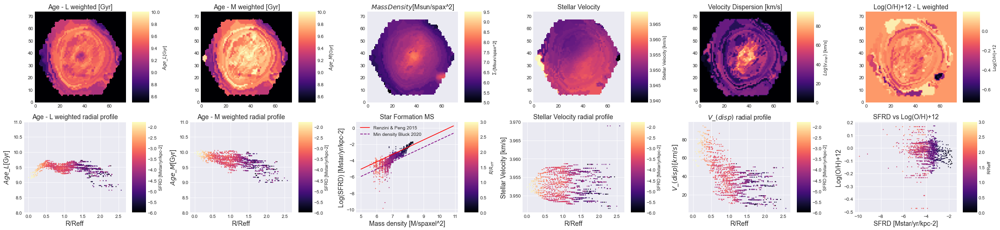

In [100]:
pipe3d_plots('8312-12704', 'bbrd')

[WARNING]: np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead (DeprecationWarning)
[WARNING]: The following kwargs were not used by contour: &#39;inline&#39;, &#39;fontsize&#39; (UserWarning)
[WARNING]: np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead (DeprecationWarning)
[WARNING]: The following kwargs were not used by contour: &#39;inline&#39;, &#39;fontsize&#39; (UserWarning)
[WARNING]: np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead (DeprecationWarning)
[WARNING]: The following kwargs were not used by contour: &#39;inline&#39;, &#39;fontsize&#39; (UserWarning)
[WARNING]: np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead (DeprecationWarning)
[WARNING]: The following kwargs were not used by contour: &#39;inline&#39;, &#39;fontsize&#39; (UserWarning)
[WARNING]: np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead (DeprecationWarning)
[WARNING]: The following kwargs were not used by contour: &

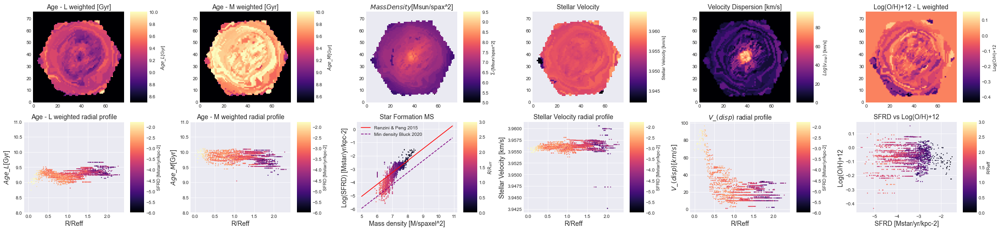

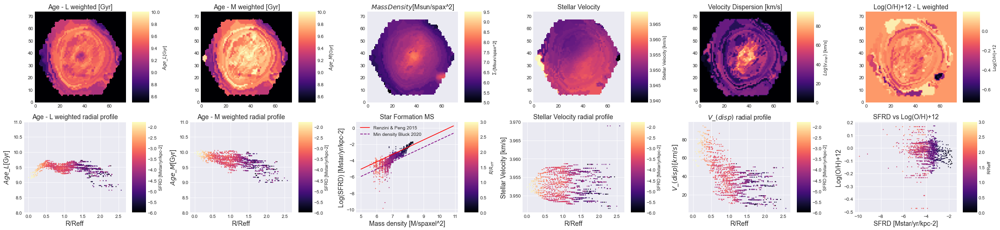

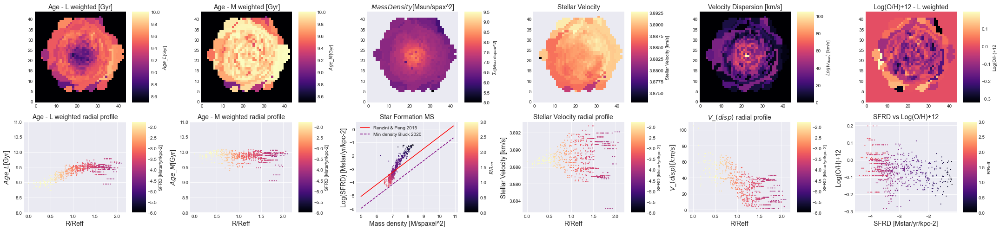

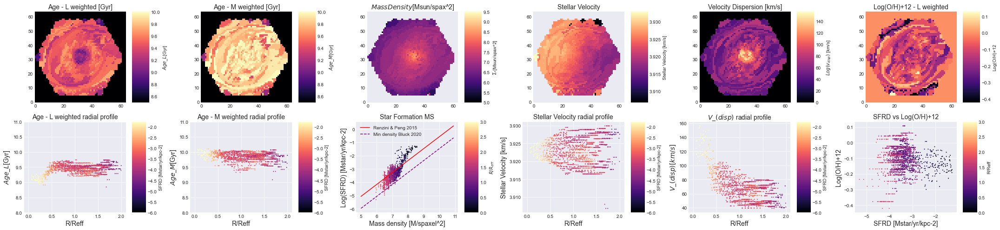

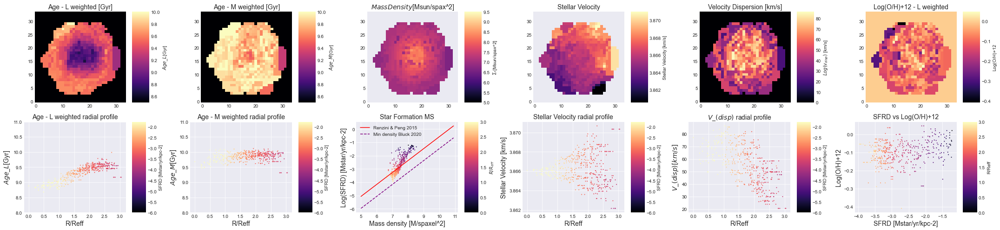

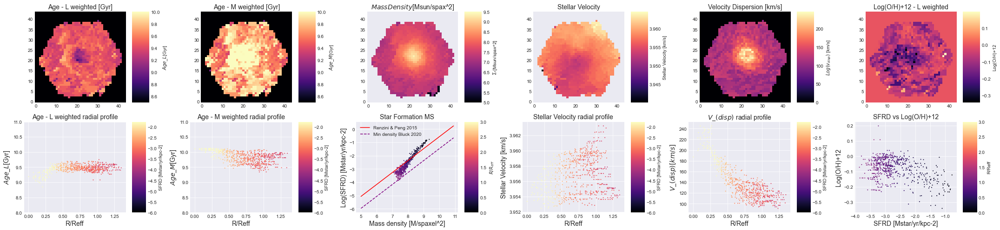

In [516]:
#for ifu in bbrd_plateifu:
#    pipe3d_plots(ifu, 'bbrd')
#
#import glob
#lg12_pipe3d_list = glob.glob('/Users/mmckay/Desktop/research/FMR_MZR/#lg12_pipe3d_fits/*fits')
#lg12_p3d_plateifu = []
#for fit in lg12_pipe3d_list:
#    hdu = fits.open(fit)
#    plateifu = hdu[0].header['plateifu']
#    #print(plateifu)
#    pipe3d_plots(plateifu, 'lg12')
#    hdu.close()


# Make $\Delta$SFR map and radial profiles from Bluck et al 2020

In [120]:
plateifu = '8312-12704'
age_l, age_m, metal_l, metal_m, metal_err, age_err, stel_vel, vel_err, v_disp, v_err, ml_ratio, mass_density = pipe3d_maps(plateifu=plateifu, sample='bbrd')
maps = Maps(plateifu)
radius_map = radius_ratio_map(plateifu)
m_sfrd, m_n2o2, m_o3n2, m_n2, m_n2s2, sfrd_map, n2o2_Z_map, o3n2_Z_map, n2_Z_map, n2s2_Z_map, spaxel_diamter_in_kpc, Area_of_each_spaxels = all_sfrd_Z_plots(plateifu, sample='bbrd')

[WARNING]: np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead (DeprecationWarning)
[WARNING]: The following kwargs were not used by contour: 'inline', 'fontsize' (UserWarning)


In [127]:
Area_of_each_spaxels

<Quantity 0.27598295 kpc2>

In [126]:
spaxel_diamter_in_kpc

<Quantity 0.29639181 kpc>

In [125]:
mass_density[26,26] + 3.62

10.886823642924206

In [294]:
def delta_sfr_plot(plateifu, sample):
    age_l, age_m, metal_l, metal_m, metal_err, age_err, stel_vel, vel_err, v_disp, v_err, ml_ratio, mass_density = pipe3d_maps(plateifu=plateifu, sample=sample)
    radius_map = radius_ratio_map(plateifu)
    m_sfrd, m_n2o2, m_o3n2, m_n2, m_n2s2, sfrd_map, n2o2_Z_map, o3n2_Z_map, n2_Z_map, n2s2_Z_map, spaxel_diamter_in_kpc, Area_of_each_spaxels = all_sfrd_Z_plots(plateifu, sample=sample)


    # Calculate SFMS fit map using mass density maps
    sfms_fit_map = 0.90 * mass_density - 9.57
    delta_sfr = sfrd_map - sfms_fit_map


    fig, (ax1, ax2, ax3, ax4, ax5)= plt.subplots(1,5, figsize=(35,6))
    im1 = ax1.imshow(delta_sfr, vmin=-2.0, vmax=0.25, origin='lower', cmap='seismic_r')
    fig.colorbar(im1, ax=ax1, label='$\Delta$SFR', aspect=5.3, orientation='vertical')
    ax1.set_title('$\Delta$SFR', fontsize=15)

    ax2.scatter(radius_map, delta_sfr, c=delta_sfr, cmap='seismic_r', vmin=-2.0,   vmax=0.25)
    ax2.set_xlabel('$R/R_{eff}$', fontsize=15)
    ax2.set_ylabel('$\Delta$SFR', fontsize=15)
    ax2.grid()


    ax3.scatter(mass_density, sfrd_map, c=delta_sfr, cmap='seismic_r', vmin=-2.0,   vmax=0.25)
    logm_list = np.arange(5.0, 11.0, 0.1)
    sfms_fit = 0.90 * logm_list - 9.57
    ax3.plot(logm_list, sfms_fit, color='red', label='Renzini & Peng 2015')
    ax3.plot(logm_list, sfms_fit-0.9, color='purple', label='Min density Bluck 2020',   linestyle='--')
    ax3.set_xlabel('$\Sigma_{M_\star} [M_\odot/spaxel^2]$', fontsize=20)
    ax3.set_ylabel('$\Sigma_{SFR} [M_\odot yr^-1 kpc^-2]$', fontsize=20)
    ax3.set_xlim(5,10)
    ax3.set_title('Star-forming Main Sequence', fontsize=15)
    ax3.grid()
    ax3.legend()

    ax4.hist(delta_sfr[~np.isinf(delta_sfr)], bins=50, color='blue')
    ax4.axvline(-0.8, color='purple',linestyle='--', label='Bluck 2020, min of dist')
    ax4.axvline(-1.1, color='red',linestyle='-', label='Quenched')
    ax4.axvline(0.5, color='magenta',linestyle='-', label='Starburst')
    ax4.set_xlabel('$\Delta$SFR', fontsize=20)
    ax4.set_ylabel('Frequency', fontsize=20)
    ax4.set_xlim(-2.5,1.0)
    ax4.legend()

    # Image
    im1 = Image(plateifu)
    imfn = im1.filename
    img = mpimg.imread(imfn)
    imgplot = ax5.imshow(img, aspect=1.0)
    #ax1.set_xlim(150,400)
    #ax1.set_ylim(400, 150)
    ax5.axis('off')
    ax5.set_title(plateifu, fontsize=14)
    ax5.set_aspect(1)

    plt.rc('xtick', labelsize=15)
    plt.rc('ytick', labelsize=15)
    fig.tight_layout()


    plt.savefig('/Users/mmckay/Desktop/research/FMR_MZR/{}_deltaSFR_plots/{}_deltaSFR.jpeg'.format(sample, plateifu))
    plt.close()

In [291]:
plt.style.use('seaborn-dark')
delta_sfr_plot('8550-12703', 'bbrd')

[WARNING]: np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead (DeprecationWarning)
[WARNING]: The following kwargs were not used by contour: 'inline', 'fontsize' (UserWarning)


In [292]:
for ifu in bbrd_manga_match['plateifu']:
    delta_sfr_plot(ifu, 'bbrd')

#import glob
#lg12_pipe3d_list = glob.glob('/Users/mmckay/Desktop/research/FMR_MZR/#lg12_pipe3d_fits/*fits')
#lg12_p3d_plateifu = []
#for fit in lg12_pipe3d_list:
#    hdu = fits.open(fit)
#    plateifu = hdu[0].header['plateifu']
#    #print(plateifu)
#    #pipe3d_plots(plateifu, 'lg12')
#    delta_sfr_plot(plateifu, 'lg12')
#    hdu.close()


[WARNING]: np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead (DeprecationWarning)
[WARNING]: The following kwargs were not used by contour: 'inline', 'fontsize' (UserWarning)
[WARNING]: np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead (DeprecationWarning)
[WARNING]: The following kwargs were not used by contour: 'inline', 'fontsize' (UserWarning)
[WARNING]: np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead (DeprecationWarning)
[WARNING]: The following kwargs were not used by contour: 'inline', 'fontsize' (UserWarning)
[WARNING]: np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead (DeprecationWarning)
[WARNING]: The following kwargs were not used by contour: 'inline', 'fontsize' (UserWarning)
[WARNING]: np.asscalar(a) is deprecated since NumPy v1.16, use a.item() instead (DeprecationWarning)
[WARNING]: The following kwargs were not used by contour: 'inline', 'fontsize' (UserWarning)
[WARNING]: np.asscalar(a) is d

# -------------------------------------------------------------------------

In [93]:
#from marvin.tools import Maps
#maps = Maps('8143-1901')
#ha = maps.emline_gflux_ha_6564
#
## Default is 1 except for velocities, which default to 0.
#fig, ax = ha.plot(snr_min=5)
##fig

In [94]:
#a = maps.spx_snr
#a.plot()
#b = a.value


In [95]:
#fig = px.imshow(b, zmin=0, zmax=None, origin='lower', color_continuous_scale='magma', labels=#{'color':'1e-17erg/s/spaxel/cm^2'})
#fig.show()

In [96]:
#from marvin.tools.maps import Maps
#maps = Maps(plateifu='8597-12703', mode='local')
#print(maps)
## get an emission line map
#haflux = maps.emline_gflux_ha_6564
#values = haflux.value
#ivar = haflux.ivar
#mask = haflux.mask
#haflux.plot()
#haflux.plot(mask=mask)

In [97]:
#for i in newlg12_manga_list:
#    maps = Maps(plateifu=i, mode='local')
#    haflux = maps.emline_gflux_ha_6564
#    values = haflux.value
#    ivar = haflux.ivar
#    mask = haflux.mask
#    haflux.plot(mask=mask)

In [98]:
# Explicit call
from marvin import config
from marvin.utils.general import downloadList
config.setRelease('DR16')

# Make a list of plate-IFUs
gallist = ['8935-12701']

# Download cubes for the objects in your list
downloadList(gallist, dltype='maps')

Progress:   0%|          | 0/2 [00:00&lt;?, ?files/s, n_files=2, n_streams=2]SDSS_ACCESS&gt; Done!



In [99]:
# Using Maps and the filename to loom at the maps
fn = '/Users/mmckay/sas/dr16/manga/spectro/analysis/v2_4_3/2.2.1/HYB10-GAU-MILESHC/8935/12701/manga-8935-12701-MAPS-HYB10-GAU-MILESHC.fits.gz'
#galaxy = Maps(filename=fn, mode='local')

(&lt;Figure size 432x288 with 2 Axes&gt;,
 &lt;AxesSubplot:title={&#39;center&#39;:&#39;Emission line Gaussian flux: H-alpha 6564&#39;}, xlabel=&#39;spaxel&#39;, ylabel=&#39;spaxel&#39;&gt;)

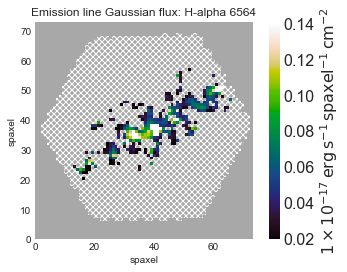

In [100]:
# Just calling the maps locally usinf the plateifu id
galaxy = Maps(plateifu='8935-12701', mode='local')
ha = galaxy.emline_gflux_ha_6564
ha.plot()